# Trabajo de Bagging & Boosting

Descripción de la tarea:

El trabajo que hemos realizado en el Working Lab nos sirve como base para la presente entrega. Partiendo del datset de alquiler de la vivienda nos hemos encontrado con que una variable muy importante para predecir el precio de la vivienda es el tamaño de la vivienda medida en metros cuadrados. Ésta es una aproximación que a priori, conocíamos y que sabíamos que iba a tener un impacto sobre el modelo final.

Temiendo que la variable de metros cuadrados pueda tener demasiado peso en el modelo y por lo tanto restarle importancia al resto de las variables, nos proponemos crear una nueva serie de modelos que sean capaces de predecir una nueva variable objetivo: precio de alquiler por metro cuadrado.

El objetivo de ésta entrega es, utilizando el conocimiento adquirido en el Working Lab, generar un modelo que sea capaz de predecir el precio de alquiler por metro cuadrado, para generar predicciones en el dataset de compra de los pisos.

Se pide:

Análisis exploratorio y limpieza de instancias (1.5p): 
En éste punto se busca que entendáis bien el dataset y que hagáis las transformaciones necesarias para entender mejor los datos que tenéis. Se valorará mediante:

- Estadística descriptiva y calidad general de los datos

- Visualizaciones que ayuden a entender la distribución de las variables y categorías

- Visualizaciones que ayuden a entender la relación entre los atributos y la variable objetivo precio_de_alquiler_por_metro_cuadrado

- Estadísticos que nos ayuden a comprender mejor la relación (PCA, ANOVA, Correlación...)

- Resumen de las conclusiones sacadas en este punto 

Creación y comparación de modelos: (4.5p)
En éste punto se pide que se desarrollen al menos 1 modelo de Bagging, 1 modelo de Random Forest y 1 modelo de Boosting a escoger entre CATBoost, XGBoost o LightGBM. Cada modelo debe seguir los siguientes pasos:

- Preprocesamiento de los datos: Hacer las transformaciones necesarias para que cada modelo pueda ser entrenado

- Split entre training y test

- Hiperoptimización de parámetros mediante grid search

- Entrenamiento del modelo en training mediante 10 Fold Cross Validation

- Entrenamiento del modelo con todos los datos de training y validación con test

- Comparación de resultados obtenidos tanto en training cómo en test

Como condiciones, el split entre train y test debe ser del 80% - 20% y la métrica de validación debe ser el R2

Análisis de Shap values para el modelo de boosting escogido: (1.5p)
En éste punto se pide que desarrolléis un análisis completo de Shap sobre el modelo de boosting que hayáis desarrollado en el punto anterior.

Generación de predicciones en el dataset de venta y selección de las 20 viviendas más rentables y más baratas para comprar: (1.5p):
En éste punto se pide que seleccionéis el mejor modelo de los generados anteriormente y que generéis predicciones sobre el dataset de venta de la vivienda siguiendo estos pasos:


- Preparación del dataset de venta de pisos: El modelo que habéis generado admite datos que habéis transformado previamente (Cambio de variable para la variable objetivo, sustitución de null values, columnas no utilizadas...).

- Cálculo de las predicciones sobre el dataset de venta

- Cálculo de la métrica de Break-even (número de meses que se tarda en rentabilizar la vivienda), resultante de dividir el precio de la vivienda por número de metros cuadrados y por la predicción del precio de alquiler por mes.

- Selección de las 20 mejores viviendas más rentables (Break-even más bajo) y más baratas (menor precio de compra)

Resultados finales, conclusiones y vías abiertas: (1p):
En primer lugar se solicita que incluyáis el resultado de R2 para el dataset de validación de vuestro mejor modelo. Posteriormente, que desarrolléis los siguientes puntos: ¿Qué limitaciones hemos tenido con nuestro modelo?, ¿Lo utilizaríamos en la vida real?, ¿Cómo podemos mejorar los resultados obtenidos?

Comentarios:


Se deben entregar dos archivos: 1 Notebook en formato ipynb con el código ya corrido en todas las celdas y la misma entrega en formato pdf dado que algunas de las visualizaciones como las de catboost se pierden.

Este ejercicio no tiene una solución única. Muchas opciones pueden ser válidas, pero se espera que se haga una interpretación de los datos obtenidos en todos los puntos.

Evidentemente, hay ciertas variables que deben ser normalizadas en base al número de metros cuadrados:

Precio de alquiler deberá transformarse a precio por metro cuadrado

Número de habitaciones deberá transformarse a habitaciones por metro cuadrado

Número de baños deberá transformarse a baños por metro cuadrado

Fecha de entrega máxima: 17 de Marzo

In [1]:
# Library load
import pandas as pd
import numpy as np

# Plotting library
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import catboost as cat

# Estadistica
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Sklearn packages
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
from sklearn.pipeline import make_pipeline 
from sklearn import metrics 
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_validate 
from sklearn.model_selection import GridSearchCV 
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import mutual_info_classif

# Shap
import shap
shap.initjs()


In [2]:
# Cargamos el dataset y observamos las primeras observaciones
data = pd.read_csv('0_processed_renting_Barcelona.csv', delimiter = ',')
data.head()

,id,price,currency,latitude,longitude,sq_meters,sq_meters_built,rooms,bathrooms,balcony,...,neighborhood,dist_city_center,furniture,garage,property_type,garden,closest_station,dist_closest_station,created_at,last_seen
0,536625,850,€/mes,41.401708,2.154077,52.0,55,2,1,NaN,...,Gràcia,2.026455,3.0,NaN,piso,NaN,Fontana,0.094111,9/1/2021 15:58,10/4/2021 6:01
1,545910,725,€/mes,41.407221,2.135569,32.0,37,2,1,1.0,...,Sant Gervasi - La Bonanova,3.582409,NaN,NaN,piso,NaN,Vallcarca,0.902561,9/2/2021 15:24,9/8/2021 12:29
2,570697,950,€/mes,41.411508,2.164608,NaN,72,3,1,NaN,...,El Baix Guinardó,2.663025,3.0,NaN,piso,NaN,Alfons X,0.188177,8/28/2021 23:52,8/28/2021 23:52
3,591588,750,€/mes,41.402256,2.140764,NaN,45,1,1,1.0,...,Sant Gervasi - La Bonanova,2.910067,3.0,NaN,piso,NaN,Lesseps,0.892917,8/29/2021 11:25,9/8/2021 12:29
4,610243,990,€/mes,41.405327,2.146929,NaN,45,1,1,NaN,...,Sarrià-Sant Gervasi,2.727149,3.0,NaN,piso,NaN,Lesseps,0.293784,8/30/2021 13:48,8/30/2021 14:04


Buscamos que variables tienen valores nulos y cuantos hay en cada una de ellas.

In [3]:
data.isnull().sum()

id                         0
price                      0
currency                   0
latitude                   0
longitude                  0
sq_meters               3535
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                 5017
terrace                 6574
exterior                 666
orientation             4816
floor                   1966
rooftop                 7885
elevator                 257
doorman                 8502
pool                    8181
ac                      4416
heating                 3030
year_built              4496
quality                    0
city                       0
neighborhood               0
dist_city_center           0
furniture               1252
garage                  8117
property_type              2
garden                  8451
closest_station            0
dist_closest_station       0
created_at                 0
last_seen                  0
dtype: int64

In [4]:
# Eliminamos variables que no nos aportan información
data_clean = data.drop(columns = ['id','latitude', 'longitude','currency','doorman','sq_meters','city','closest_station','created_at','last_seen'])

También es interesante que empezemos a analizar un poco como estan distribuidos los datos en cada una de las variables. Gracias a este análisis odemos encontrar variables que no nos van a aportar nada al modelo, por ejemplo, la varialbe quality.

In [5]:
data_clean.describe()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,year_built,quality,dist_city_center,furniture,garage,garden,dist_closest_station
count,8502.000000,8502.000000,8502.000000,8502.000000,3485.0,1928.0,7836.000000,6536.000000,617.0,8245.000000,321.0,4086.0,4006.000000,8502.0,8502.000000,7250.0,385.0,51.0,8502.000000
mean,1117.482828,72.478711,2.075394,1.265349,1.0,1.0,0.880041,3.062576,1.0,0.683808,1.0,1.0,1950.885921,2.0,2.616749,3.0,1.0,1.0,0.392531
std,1010.198242,49.650215,1.155006,0.602056,0.0,0.0,0.324935,2.104151,0.0,0.465017,0.0,0.0,38.391917,0.0,1.409102,0.0,0.0,0.0,0.290708
min,365.000000,11.000000,0.000000,1.000000,1.0,1.0,0.000000,1.000000,1.0,0.000000,1.0,1.0,1783.000000,2.0,0.062165,3.0,1.0,1.0,0.007875
25%,768.250000,50.000000,1.000000,1.000000,1.0,1.0,1.000000,2.000000,1.0,0.000000,1.0,1.0,1930.000000,2.0,1.475110,3.0,1.0,1.0,0.225168
50%,850.000000,63.000000,2.000000,1.000000,1.0,1.0,1.000000,3.000000,1.0,1.000000,1.0,1.0,1962.000000,2.0,2.481490,3.0,1.0,1.0,0.325357
75%,1100.000000,79.000000,3.000000,1.000000,1.0,1.0,1.000000,4.000000,1.0,1.000000,1.0,1.0,1974.000000,2.0,3.589782,3.0,1.0,1.0,0.453814
max,27500.000000,981.000000,11.000000,7.000000,1.0,1.0,1.000000,29.000000,1.0,1.000000,1.0,1.0,2106.000000,2.0,8.940761,3.0,1.0,1.0,3.177445


In [6]:
# También hay que eliminar la variable quality ya que vemos que es un valor fijo siempre igual a 2, y no nos aportará nada
data_clean = data_clean.drop(columns = ['quality'])

In [7]:
# Volvemos a observar los nulos en las variables restantes
data_clean.isnull().sum()

price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                 5017
terrace                 6574
exterior                 666
orientation             4816
floor                   1966
rooftop                 7885
elevator                 257
pool                    8181
ac                      4416
heating                 3030
year_built              4496
neighborhood               0
dist_city_center           0
furniture               1252
garage                  8117
property_type              2
garden                  8451
dist_closest_station       0
dtype: int64

In [8]:
# Variables categóricas
data_clean.describe(include="O").T

,count,unique,top,freq
orientation,3686,4,sur,1597
heating,5472,5,gas,1700
neighborhood,8502,76,El Raval,524
property_type,8500,8,piso,7195


Por conocimiento del dominio, también creo que la variable furniture puede ser una categórica, pero, al no aparecerme en el anterior resultado, decido observar como se comporta.

In [9]:
data_clean['furniture'].describe().T

count    7250.0
mean        3.0
std         0.0
min         3.0
25%         3.0
50%         3.0
75%         3.0
max         3.0
Name: furniture, dtype: float64

In [10]:
# Quiero saber las clcases que hay en cada variable
categoricas = ['neighborhood', 'property_type', 'orientation', 'heating', 'furniture']

for categorica in categoricas:
    clases = data_clean[categorica].unique()
    print(f"Clases en la variable '{categorica}': {clases}")

Clases en la variable 'neighborhood': ['Gràcia' 'Sant Gervasi - La Bonanova' 'El Baix Guinardó'
 'Sarrià-Sant Gervasi' 'Hostafrancs' 'Vila de Gràcia' 'La Sagrada Família'
 'El Poblenou' 'Eixample' 'Sants - Badal' 'Sants'
 "La Nova Esquerra de l'Eixample" 'Sant Gervasi - Galvany' 'El Fort Pienc'
 'La Teixonera' "L'Antiga Esquerra de l'Eixample"
 'El Poble Sec - Parc de Montjuïc' 'El Guinardó' 'Les Tres Torres'
 'La Barceloneta' "El Camp d'En Grassot i Gràcia Nova"
 'El Putxet i el Farró' 'Horta' "El Camp de l'Arpa del Clot" 'Navas'
 'Provençals del Poblenou' 'El Coll' "La Dreta de l'Eixample"
 'Ciutat Vella' 'Les Corts' 'Vilapicina i la Torre Llobeta'
 'Vallcarca i els Penitents' 'El Raval' 'La Prosperitat' 'Sant Antoni'
 'Sant Pere - Santa Caterina i la Ribera' 'Can Baró' 'El Gòtic'
 'La Vila Olímpica del Poblenou' 'La Sagrera' 'Horta Guinardó' 'El Carmel'
 'Sarrià' 'La Maternitat i Sant Ramon' 'Sant Andreu' 'Nou Barris'
 'La Guineueta' 'La Salut' 'Sants-Montjuïc' 'La Bordeta' 'Pedralb

Tenemos una variable con demasiados clases, y sabiendo que esto puede ser problemático para el one-hot encoding que haremos más adelante, creo que es interesante probar de agrupar estas clases en clases algo más generalistas pero sin perder un exceso de información que creo que puede aportar al modelo.

In [11]:
# Definir la asignación de barrios a distritos
asignacion_distritos = {
    'Gràcia': 'Gràcia',
    'Sant Gervasi - La Bonanova': 'Sarrià-Sant Gervasi',
    'El Baix Guinardó': 'Horta-Guinardó',
    'Sarrià-Sant Gervasi': 'Sarrià-Sant Gervasi',
    'Hostafrancs': 'Sants-Montjuïc',
    'Vila de Gràcia': 'Gràcia',
    'La Sagrada Família': 'Eixample',
    'El Poblenou': 'Sant Martí',
    'Eixample': 'Eixample',
    'Sants - Badal': 'Sants-Montjuïc',
    'Sants': 'Sants-Montjuïc',
    "La Nova Esquerra de l'Eixample": 'Eixample',
    'Sant Gervasi - Galvany': 'Sarrià-Sant Gervasi',
    'El Fort Pienc': 'Eixample',
    "L'Antiga Esquerra de l'Eixample": 'Eixample',
    'El Poble Sec - Parc de Montjuïc': 'Sants-Montjuïc',
    'El Guinardó': 'Horta-Guinardó',
    'Les Tres Torres': 'Sarrià-Sant Gervasi',
    'La Barceloneta': 'Ciutat Vella',
    "El Camp d'En Grassot i Gràcia Nova": 'Gràcia',
    'El Putxet i el Farró': 'Sarrià-Sant Gervasi',
    'Horta': 'Horta-Guinardó',
    "El Camp de l'Arpa del Clot": 'Sant Martí',
    'Navas': 'Sant Andreu',
    'Provençals del Poblenou': 'Sant Martí',
    'El Coll': 'Horta-Guinardó',
    "La Dreta de l'Eixample": 'Eixample',
    'Ciutat Vella': 'Ciutat Vella',
    'Les Corts': 'Les Corts',
    'Vilapicina i la Torre Llobeta': 'Sant Andreu',
    'Vallcarca i els Penitents': 'Gràcia',
    'El Raval': 'Ciutat Vella',
    'La Prosperitat': 'Nou Barris',
    'Sant Antoni': 'Eixample',
    'Sant Pere - Santa Caterina i la Ribera': 'Ciutat Vella',
    'Can Baró': 'Horta-Guinardó',
    'El Gòtic': 'Ciutat Vella',
    'La Vila Olímpica del Poblenou': 'Sant Martí',
    'La Sagrera': 'Sant Andreu',
    'Horta Guinardó': 'Horta-Guinardó',
    'El Carmel': 'Horta-Guinardó',
    'Sarrià': 'Sarrià-Sant Gervasi',
    'La Maternitat i Sant Ramon': 'Les Corts',
    'Sant Andreu': 'Sant Andreu',
    'Nou Barris': 'Nou Barris',
    'La Guineueta': 'Nou Barris',
    'La Salut': 'Gràcia',
    'Sants-Montjuïc': 'Sants-Montjuïc',
    'La Bordeta': 'Sants-Montjuïc',
    'Pedralbes': 'Les Corts',
    'Porta': 'Horta-Guinardó',
    'El Congrés i els Indians': 'Nou Barris',
    'La Font de la Guatlla': 'Sants-Montjuïc',
    'Diagonal Mar i el Front Marítim del Poblenou': 'Sant Martí',
    'El Clot': 'Sant Martí',
    "La Font d'En Fargues": 'Horta-Guinardó',
    'El Besòs': 'Sant Martí',
    'Sant Martí de Provençals': 'Sant Martí',
    'Sant Genís Dels Agudells - Montbau': 'Horta-Guinardó',
    'El Parc i la Llacuna del Poblenou': 'Sant Martí',
    "La Vall d'Hebron - La Clota": 'Horta-Guinardó',
    'El Bon Pastor': 'Sant Andreu',
    'Can Peguera - El Turó de la Peira': 'Nou Barris',
    'Sant Martí': 'Sant Martí',
    'La Marina del Port': 'Sants-Montjuïc',
    'Verdun': 'Nou Barris',
    'La Marina del Prat Vermell': 'Sants-Montjuïc',
    'Ciutat Meridiana - Torre Baró - Vallbona': 'Nou Barris',
    'La Verneda i la Pau': 'Sant Martí',
    'La Trinitat Vella': 'Nou Barris',
    'Les Roquetes': 'Nou Barris',
    'Vallvidrera - El Tibidabo i les Planes': 'Sarrià-Sant Gervasi',
    'Canyelles': 'Nou Barris',
    'La Trinitat Nova': 'Nou Barris',
    'Baró de Viver': 'Sant Andreu',
    'La Teixonera': 'Horta-Guinardó'
}

# Crear una nueva columna en tu conjunto de datos con los distritos asignados
data_clean['distrito'] = data_clean['neighborhood'].map(asignacion_distritos)

# Verificar los resultados
data_clean[['neighborhood', 'distrito']].head()


,neighborhood,distrito
0,Gràcia,Gràcia
1,Sant Gervasi - La Bonanova,Sarrià-Sant Gervasi
2,El Baix Guinardó,Horta-Guinardó
3,Sant Gervasi - La Bonanova,Sarrià-Sant Gervasi
4,Sarrià-Sant Gervasi,Sarrià-Sant Gervasi


He querido asegurarme de que no había errores en la transformación.

In [12]:
# Obtener la cantidad de barrios únicos antes de la asignación
barrios_originales = len(data_clean['neighborhood'].unique())

# Obtener la cantidad de distritos únicos después de la asignación
distritos_asignados = len(asignacion_distritos)

# Verificar si la cantidad de barrios únicos es igual a la cantidad de distritos únicos
if barrios_originales == distritos_asignados:
    print("La asignación se ha realizado correctamente para todos los barrios.")
else:
    print("Asegúrate de que todos los barrios estén incluidos en la asignación.")


La asignación se ha realizado correctamente para todos los barrios.


In [13]:
data_clean = data_clean.drop(columns = 'neighborhood')

In [14]:
# Volvemos a analizar las clases
categoricas = ['distrito', 'property_type', 'orientation', 'heating', 'furniture']

for categorica in categoricas:
    clases = data_clean[categorica].unique()
    print(f"Clases en la variable '{categorica}': {clases}")

Clases en la variable 'distrito': ['Gràcia' 'Sarrià-Sant Gervasi' 'Horta-Guinardó' 'Sants-Montjuïc'
 'Eixample' 'Sant Martí' 'Ciutat Vella' 'Sant Andreu' 'Les Corts'
 'Nou Barris']
Clases en la variable 'property_type': ['piso' 'estudio' 'atico' 'duplex' 'chalet_adosado' 'chalet_independiente'
 'chalet_pareado' 'chalet' nan]
Clases en la variable 'orientation': [' norte' ' sur' nan ' este' ' oeste']
Clases en la variable 'heating': [nan 'gas' 'na' 'bomba' 'electric' 'individual']
Clases en la variable 'furniture': [ 3. nan]


Conociendo el dominio y viendo sus distribuciones, también podemos asumir que hay una serie de variables que en caso de tomar valores nulos, representa que el piso no tiene la característica concreta que representan. Sabiendo esto, poemos establecer que todos los valores nulos son 0 y tratarlas como variables binarias.

In [15]:
fill_na = ['balcony', 'terrace', 'exterior', 'floor', 'rooftop', 'elevator', 'pool', 'ac', 'garage', 'garden'] 
for i in range(0,len(fill_na)):
   data_clean[fill_na[i]].fillna(0, inplace = True) 
data_clean.isnull().sum()

price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                    0
terrace                    0
exterior                   0
orientation             4816
floor                      0
rooftop                    0
elevator                   0
pool                       0
ac                         0
heating                 3030
year_built              4496
dist_city_center           0
furniture               1252
garage                     0
property_type              2
garden                     0
dist_closest_station       0
distrito                   0
dtype: int64

Tenemos 3 variables catégoricas de las que desconocemos algunos de sus datos, así que tendremos que substituir los valores nulos por 'Desconocido'.

Para la variable de property type, donde solo tenemos dos observaciones nulas, lo que haremos sera simplemente elimianr estas dos observaciones

In [16]:
data_desconocida = ['orientation','heating','furniture'] 
for i in range(0,len(data_desconocida)):
   data_clean[data_desconocida[i]].fillna('desconocida', inplace = True) 
   
data_clean = data_clean.dropna(subset=['property_type'])

data_clean.isnull().sum()

C:\Users\Marc\AppData\Local\Temp\ipykernel_2676\581309402.py:3: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'desconocida' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  data_clean[data_desconocida[i]].fillna('desconocida', inplace = True)


price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                    0
terrace                    0
exterior                   0
orientation                0
floor                      0
rooftop                    0
elevator                   0
pool                       0
ac                         0
heating                    0
year_built              4494
dist_city_center           0
furniture                  0
garage                     0
property_type              0
garden                     0
dist_closest_station       0
distrito                   0
dtype: int64

In [17]:
categoricas = ['distrito', 'property_type', 'orientation', 'heating', 'furniture']

for categorica in categoricas:
    clases = data_clean[categorica].unique()
    print(f"Clases en la variable '{categorica}': {clases}")

Clases en la variable 'distrito': ['Gràcia' 'Sarrià-Sant Gervasi' 'Horta-Guinardó' 'Sants-Montjuïc'
 'Eixample' 'Sant Martí' 'Ciutat Vella' 'Sant Andreu' 'Les Corts'
 'Nou Barris']
Clases en la variable 'property_type': ['piso' 'estudio' 'atico' 'duplex' 'chalet_adosado' 'chalet_independiente'
 'chalet_pareado' 'chalet']
Clases en la variable 'orientation': [' norte' ' sur' 'desconocida' ' este' ' oeste']
Clases en la variable 'heating': ['desconocida' 'gas' 'na' 'bomba' 'electric' 'individual']
Clases en la variable 'furniture': [3.0 'desconocida']


In [18]:
# Reemplazar el valor numérico '3.0' por el string 'muebles' en la variable 'furniture'
data_clean['furniture'] = data_clean['furniture'].replace(3.0, 'muebles')

La variable heating es un caso un poco distinto. Tenemos dos situaciones distintos, algunos datos tenemos un valor que nos indica que no se encontraron datos para esa observación (nan), por otro lado, tenemos observaciones que parecen indicar que no hay calefacción(na). Para tratar todos estos casos, he decidido asumir que los casos que no tenían valor seran pisos de los que desconocemos su información y, por lo contrario, de los que no tenemos información los agruparemos en la clase 'no_heating'.

In [19]:
# Contar los valores 'NA' en la variable 'heating'
na_count = data_clean['heating'].value_counts().get('na', 0)

# Imprimir el resultado
print(f"Cantidad de valores 'NA' en la variable 'heating': {na_count}")


Cantidad de valores 'NA' en la variable 'heating': 1548


In [20]:
# Reemplazar 'na' con 'no_heating'
data_clean['heating'] = data_clean['heating'].replace('na', 'no_heating')

# Verificar los resultados
data_clean['heating'].value_counts()


heating
desconocida    3030
gas            1700
no_heating     1548
individual      785
electric        744
bomba           693
Name: count, dtype: int64

A nivel de valores nulos, solo nos faltará por tratar la variable year_built que contiene casi 4500 observaciones con nulos y es la que nos da la información acerca de cuando fueron construidas las viviendas. Merce la pena observar la distribución de esta varialbe antes de continuar.

In [21]:
# Histogramas y boxplots
figure = px.histogram(data_clean, x='year_built', marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f'Histograma y Boxplot de Year Built', paper_bgcolor="white", plot_bgcolor="white")
figure.show()

Se observan varias cosas:
- Para empezar vemos que hay un valor que toma como año de construcción el 2106. Es un outlier que debemos modificar/elimianr ya que no se me ocurre porque podemos tener este valor tan lejano en el tiempo y parece evidente que es un error.
- Tambien vemos que hay bastante concentración de datos entre 1930 y 1974, ya que tenemos un 50% de los datos totales allí
- Por último, se observan algunos outliers por la parte inferior del boxplot, edificios construidos en el siglo 18. He buscado un poco de información acerca de ellos y parece ser que pueden ser datos correctos.

De cara a hacer una clasificación de estos datos entre grandes grupos, una vez analizados los datos creo que la mejor clasificación será:
- Edificios creados antes de 1863 (outliers por la parte inferior)
- Edificios entre 1863 y 1930 (parte inferior del boxplot)
- Edifcios entre 1930 y 1962 (hasta la mediana)
- Edificios desde 1962 hasta 1974
- Edicions de 1974 hasta la actualidad
- Todos los edificios sobre los que no tenemos datos seran un último grupo, añadiendo el outlier mencionado al inicio, que parece ser un error.


In [22]:
# Definir los límites de las clases y etiquetas
limites_clases = [float('-inf'), 1863, 1930, 1962, 1974, 2024, float('inf')]
etiquetas_clases = ['Antes de 1863', '1863-1930', '1930-1962', '1962-1974', '1974-2024', 'Desconocido']

# Crear una nueva columna categórica basada en los límites de las clases
data_clean['year_built_class'] = pd.cut(data_clean['year_built'], bins=limites_clases, labels=etiquetas_clases, include_lowest=True)

# Asignar valores nulos
data_clean['year_built_class'] = data_clean['year_built_class'].fillna('Desconocido')

# Imprimir las primeras filas del DataFrame con la nueva columna
print(data_clean['year_built_class'].value_counts())


year_built_class
Desconocido      4495
1974-2024         993
1863-1930         982
1962-1974         979
1930-1962         936
Antes de 1863     115
Name: count, dtype: int64


In [23]:
data_clean = data_clean.drop(columns = 'year_built')

In [24]:
data_clean.isnull().sum()

price                   0
sq_meters_built         0
rooms                   0
bathrooms               0
balcony                 0
terrace                 0
exterior                0
orientation             0
floor                   0
rooftop                 0
elevator                0
pool                    0
ac                      0
heating                 0
dist_city_center        0
furniture               0
garage                  0
property_type           0
garden                  0
dist_closest_station    0
distrito                0
year_built_class        0
dtype: int64

In [25]:
categoricas = ['distrito', 'property_type', 'orientation', 'heating', 'furniture','year_built_class']

# Transformaciones de los Datos

In [26]:
# Transformamos las variables para tenerlas en la misma esscala
data_clean['precio_m2'] = data_clean['price']/data_clean['sq_meters_built']
data_clean['habs_m2'] = data_clean['rooms']/data_clean['sq_meters_built']
data_clean['baños_m2'] = data_clean['bathrooms']/data_clean['sq_meters_built']

In [27]:
data_clean = data_clean.drop(columns = ['price','bathrooms','rooms', 'sq_meters_built'])

In [28]:
data_clean.head()

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,furniture,garage,property_type,garden,dist_closest_station,distrito,year_built_class,precio_m2,habs_m2,baños_m2
0,0.0,0.0,1.0,norte,2.0,0.0,0.0,0.0,1.0,desconocida,...,muebles,0.0,piso,0.0,0.094111,Gràcia,Desconocido,15.454545,0.036364,0.018182
1,1.0,0.0,1.0,sur,3.0,0.0,1.0,0.0,1.0,desconocida,...,desconocida,0.0,piso,0.0,0.902561,Sarrià-Sant Gervasi,1930-1962,19.594595,0.054054,0.027027
2,0.0,0.0,1.0,desconocida,4.0,0.0,1.0,0.0,1.0,desconocida,...,muebles,0.0,piso,0.0,0.188177,Horta-Guinardó,Desconocido,13.194444,0.041667,0.013889
3,1.0,0.0,1.0,norte,4.0,0.0,1.0,0.0,0.0,desconocida,...,muebles,0.0,piso,0.0,0.892917,Sarrià-Sant Gervasi,1930-1962,16.666667,0.022222,0.022222
4,0.0,0.0,1.0,sur,3.0,0.0,1.0,0.0,0.0,gas,...,muebles,0.0,piso,0.0,0.293784,Sarrià-Sant Gervasi,Desconocido,22.000000,0.022222,0.022222


# Análisis Numéricas

Para continuar con nuestro proyecto, hace falta que hagamos un análisis tan extenso como podamos de las variables, sus distribuciones y que impacto tienen sobre la variable objetivo.

In [29]:
data_numericas = data_clean.drop(columns = categoricas)

In [30]:
data_numericas.describe()

,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,precio_m2,habs_m2,baños_m2
count,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000,8500.000000
mean,0.409765,0.226588,0.811294,2.354941,0.072588,0.663294,0.037765,0.480471,2.616102,0.045294,0.005765,0.392153,15.902234,0.029611,0.019310
std,0.491819,0.418649,0.391298,2.251881,0.259475,0.472611,0.190638,0.499648,1.408636,0.207961,0.075711,0.289692,5.535359,0.013753,0.006741
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.062165,0.000000,0.000000,0.007875,1.626898,0.000000,0.001085
25%,0.000000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.474923,0.000000,0.000000,0.225166,12.348920,0.021277,0.014706
50%,0.000000,0.000000,1.000000,2.000000,0.000000,1.000000,0.000000,0.000000,2.481134,0.000000,0.000000,0.325333,14.545455,0.030303,0.018045
75%,1.000000,0.000000,1.000000,4.000000,0.000000,1.000000,0.000000,1.000000,3.588852,0.000000,0.000000,0.453671,17.857143,0.040000,0.022222
max,1.000000,1.000000,1.000000,29.000000,1.000000,1.000000,1.000000,1.000000,8.940761,1.000000,1.000000,3.177445,89.473684,0.083333,0.090909


**Estudio Correlaciones:**

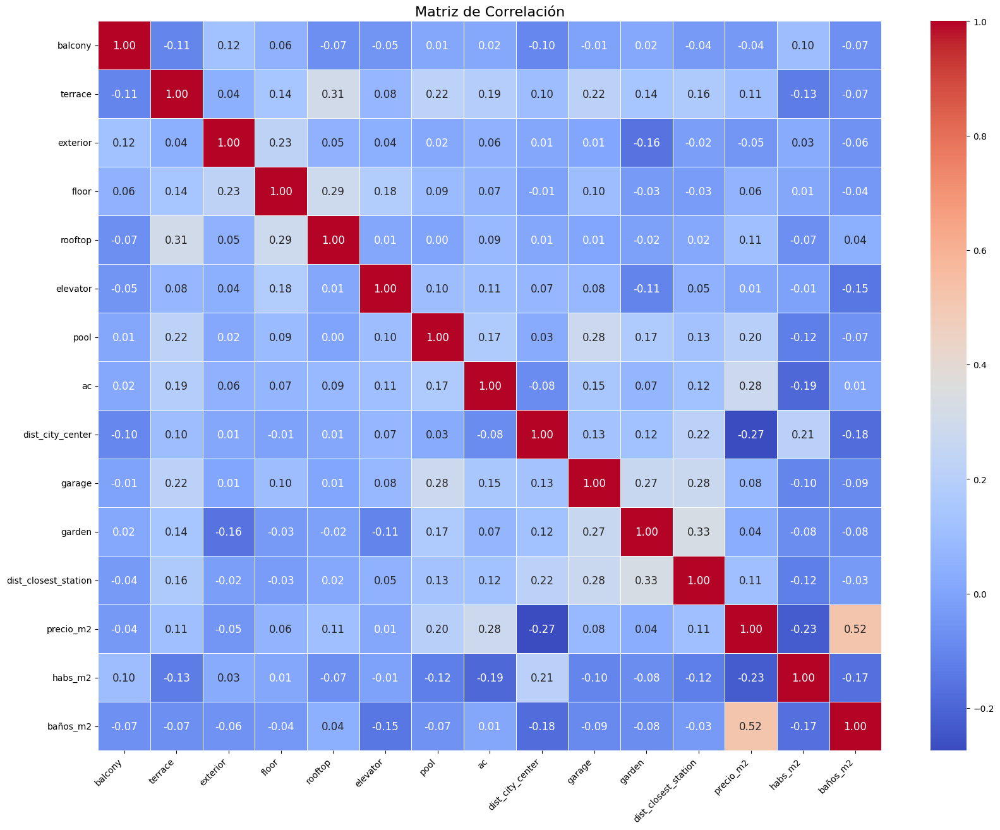

In [31]:
plt.figure(figsize=(20, 15))
heatmap = sns.heatmap(data_numericas.corr(), annot=True, fmt=".2f", cmap="coolwarm", linewidths=.5, annot_kws={"size": 12})

heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=45, horizontalalignment="right")
plt.title("Matriz de Correlación", fontsize=16)
plt.show()

Una vez separadas las variables numéricas del resto, empezamos analizando sus correlaciones, entre ellas y con la variable objetivo. Como bien se observa en este gráfico, no hay ninguna variable que este altamente correlacionada con la objetivo ni entre ellas. O no lo sufieciente como para que esto suponga un problema y tengamos que eliminar alguna variable. 

Aún así, es interesante analizar únicamente las correlaciones de todas las variables con la objetivo para tener una idea más clara.

In [32]:
# Repaso concreto de las correalciones con la variable objetivo
correlations = data_numericas.corr()
corr_precio_m2 = correlations['precio_m2'].sort_values(ascending=False)
corr_precio_m2

precio_m2               1.000000
baños_m2                0.518369
ac                      0.278260
pool                    0.198854
dist_closest_station    0.113563
rooftop                 0.113455
terrace                 0.110795
garage                  0.083868
floor                   0.063039
garden                  0.038947
elevator                0.013153
balcony                -0.038908
exterior               -0.048424
habs_m2                -0.228221
dist_city_center       -0.274702
Name: precio_m2, dtype: float64

Con esta líneas de código observamos que variables están más relacionadas con la variable objetivo. Vemos que principalmente los baños por metro cuadrado es la que más lo está positivamente y la distancia al centro de la ciudad negativamente.

**Visualizamos Distribuciones:**

Ahora estudiaremos las distribuciones de los datos en estas variables, usaremos histogramas y boxplots.

In [33]:
# Histogramas y boxplots
for column in data_numericas.columns:
    figure = px.histogram(data_numericas, x=column, marginal="box", color_discrete_sequence=["lightblue"])
    figure.update_layout(title_text= f" Histograma y Boxplot de {column}", paper_bgcolor="white", plot_bgcolor="white")
    figure.show()

Con estos graficos nos hacemos una idea de como estan distribuidos los datos en cada una de las variables y podemos empezar a extraer algunas conclusiones. Por ejemplo, las variables binarias, hay algunas que estan relativamente balanceadas, como balcony y ac, pero en la gran mayoría el desbalanceo es muy notable

Por otro lado, en las variables continuas vemos que la mayoría de los outliers están siempre en la parte superior, es decir, por encima del último cuartil. Esto tiene todo el sentido del mundo ya que puedee haber pisos excesivamente caros, grandes, o con muchas habitaciones (tres ejemplos) pero el mínimo de todas estas característcas si que es fijo, y no puede tomar valores negativos. Un detalle muy a tener en cuenta que, aunque podría haber visto antes, lo he visto en este paso, es que existen bastantes pisos con 0 habitaciones, esto hace que la varialbe hab_m2 sea igual a 0.

In [34]:
# Contar valores iguales a cero en la variable 'habs_m2'
cuenta_ceros_habs_m2 = (data_numericas['habs_m2'] == 0).sum()

print(f"Número pisos con 0 habitaciones': {cuenta_ceros_habs_m2}")


Número pisos con 0 habitaciones': 677


Viendo que existen 677 observaciones en las que no hya habtiaciones, no parece que sea un error, sino que deben ser pisos que estan completamente abiertos.

In [35]:
data_continuas = data_numericas.drop(columns = ['balcony', 'terrace', 'rooftop', 'elevator', 'pool', 'ac', 'garage', 'garden','exterior'])
data_binarias = data_numericas[['balcony', 'terrace', 'rooftop', 'elevator', 'pool', 'ac', 'garage', 'garden','exterior']]

<Figure size 1000x2500 with 0 Axes>

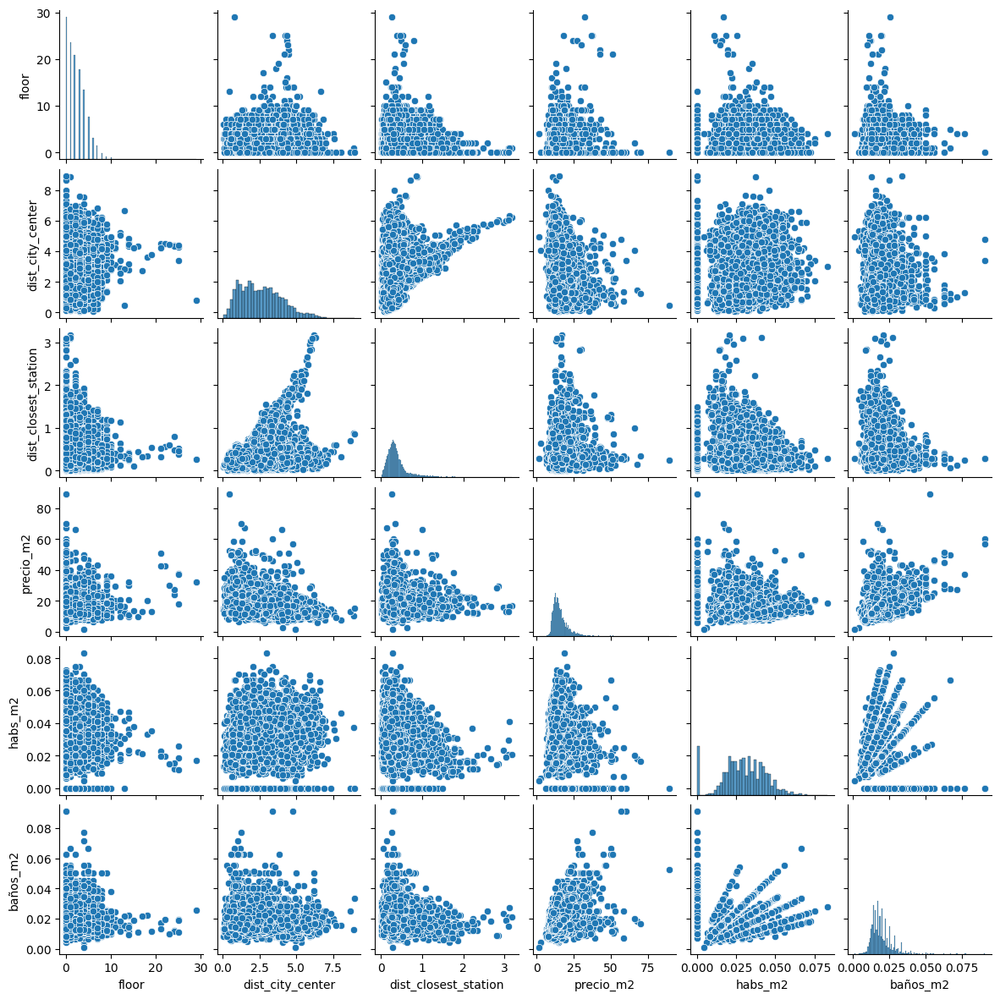

In [36]:
# Pairplot
plt.figure(figsize=(10, 25))
sns.pairplot(data_continuas, height=2)
plt.show()

Como veíamos con las correlaciones, la variable que parece estar más correlacionada con la variable objetivo es la variable de baños_m2. También se observa un alto grado de relación entre la variable baños_m2 y hab_m2, lo cuál tiene sentido porque una parte del cáclulo de esta variable proviene de los m2 y es igual. 

**Análisis de Componentes Principales (PCA)**

Otro análisis interesante de hacer para seguir conociendo los datos que vamos a utilizar y para entender como se relacionan con la varialbe objetivo es el Análisis de Componentes Pricnipales.

In [37]:
data_pca = data_numericas.drop(columns = 'precio_m2')

In [38]:
# PCA
pca = PCA(random_state=79)
x_pca = pca.fit_transform(data_pca)

explained_variance_ratio = pd.Series(pca.explained_variance_ratio_)
print(explained_variance_ratio.round(2))

0     0.61
1     0.24
2     0.03
3     0.03
4     0.02
5     0.02
6     0.02
7     0.01
8     0.01
9     0.00
10    0.00
11    0.00
12    0.00
13    0.00
dtype: float64


Con el primer paso observamos que cantidad de componentntes necesitamos para poder describir el máximo de la varianza de la variable objetvio. Con nuestros resultados, se observa que con tan solo los dos primeros componentes ya obtenemos información acerca del 85% de esta varianza.

In [39]:
loadings = pd.DataFrame(pca.components_.T, columns=[f"Componente {i+1}" for i in range(pca.components_.shape[0])]
                        , index=data_pca.columns)
print(loadings.round(2))

                      Componente 1  Componente 2  Componente 3  Componente 4  \
balcony                       0.01         -0.04         -0.27         -0.90   
terrace                       0.03          0.03          0.40          0.06   
exterior                      0.04          0.00          0.00         -0.21   
floor                         1.00          0.01         -0.04          0.02   
rooftop                       0.03          0.00          0.08          0.05   
elevator                      0.04          0.03          0.37          0.05   
pool                          0.01          0.00          0.09         -0.03   
ac                            0.02         -0.03          0.76         -0.37   
dist_city_center             -0.01          1.00         -0.02         -0.05   
garage                        0.01          0.02          0.10         -0.03   
garden                       -0.00          0.01          0.01         -0.01   
dist_closest_station         -0.00      

Sabiendo que tan solo fijandonos en los dos primeros componentes, ya obtendremos información sobre el 85% de la varianza de nuestra variable objetivo, se puede ver cuando analizamos componente a componente, que las dos variables que tienen más impacto son 'floor' y 'dist_city_center'. Esto se debe a que son las que tienen, con diferencia, más peso en los dos primeros componentes.

# Variables Categóricas

También creo que es importante tener una idea clara de como estan distribuidos los datos entre las clases de las variables categóricas que tenemos en el dataset.

In [40]:
# Variables categóricas
categoricas = ['distrito', 'property_type', 'orientation', 'heating', 'furniture', 'year_built_class']

# Crear gráficos interactivos para cada variable categórica
for categoria in categoricas:
    fig = px.histogram(data_clean, x=categoria, title=f'Distribución de {categoria}')
    fig.show()


Con respecto a las variables categóricas, se observa que en muchas de ellas tenemos mucha información desconocida. De hecho, en 3 de las seis, la clase con más observaciones es la clase 'desconocida'.

Aún así, gracias a la agrupación de los barrios en distritos de la varialbe distrito, hemos conseguido reducir el número de clases de 76 a tan solo 11, y además, en esta variable si que tenemos toda la información correctamente recogida. Por otro lado, como era de esperar, vemos que la mayoría de los immuebles son pisos, y además, estan amueblados.

**ANOVA**

Haremos el test ANOVA para todas nuestras variables categóricas y las binarias que inicialmente tenemos en el dataset numérico.

In [41]:
binarias = ['garden','garage','ac','pool','elevator','rooftop','exterior','terrace','balcony']

In [42]:
categoricas_binarias = categoricas + binarias

In [43]:
# Test ANOVA
for categorica in categoricas_binarias:
   model_def = 'precio_m2 ~ ' + categorica
   anova_model = ols(model_def, data=data_clean).fit()
   anova = sm.stats.anova_lm(anova_model, typ=2)
   print(anova)

                 sum_sq      df           F         PR(>F)
distrito   26488.031911     9.0  106.817369  2.525225e-190
Residual  233923.037051  8490.0         NaN            NaN
                      sum_sq      df          F        PR(>F)
property_type   12943.900921     7.0  63.454078  1.907328e-89
Residual       247467.168041  8492.0        NaN           NaN
                    sum_sq      df         F    PR(>F)
orientation     559.665782     4.0  4.574115  0.001088
Residual     259851.403180  8495.0       NaN       NaN
                 sum_sq      df          F        PR(>F)
heating     7418.678905     5.0  49.815142  4.984591e-51
Residual  252992.390057  8494.0        NaN           NaN
                  sum_sq      df          F        PR(>F)
furniture     829.896499     1.0  27.168613  1.908458e-07
Residual   259581.172464  8498.0        NaN           NaN
                         sum_sq      df          F        PR(>F)
year_built_class    6238.634268     5.0  41.696858  1.475492e-

Viendo los resultados del Anova se puede decir que hay diferencias entre las medias de la variable objetivo en cada una de lasa clases de estas variables. Si bien es cierto que hay algunos casos en los que el estadístico F es más grnade que en otros, y esto puede ser más evidente, todos ellos tienen un p-valor inferior a 0,05 así que nuestra afirmación será correcta.

# Modelo de Bagging

Empezaremos haciendo un modelo de Bagging usando solo las variables numéricas que tenemos en este dataset, sin haber hecho one hot encoding para las categóricas. La idea es empezar observando los resultados de este modelo y compararlos con el mejor resultado obtenido cuando creemos uno similar pero para el dataset que incluye las categóricas.

Para ello, seguiremos estos pasos:

1. Separaremos el data set entre train y test
2. Seleccionaremos una metrica de optimización, en este caso sera el R2
3. Parametrizaremos el modelo con Grid Search
4. Entrenaremos el modelo
5. Analizaremos los resultados observando los weak learners creados y guardando los resultados para futuras comparaciones

In [44]:
data_numericas.head()

,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,precio_m2,habs_m2,baños_m2
0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.0,0.0,0.094111,15.454545,0.036364,0.018182
1,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.0,0.0,0.902561,19.594595,0.054054,0.027027
2,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.0,0.0,0.188177,13.194444,0.041667,0.013889
3,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.0,0.0,0.892917,16.666667,0.022222,0.022222
4,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.0,0.0,0.293784,22.000000,0.022222,0.022222


In [45]:
X = data_numericas.drop(['precio_m2'], axis = 1)
y = data_numericas[['precio_m2']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=79)

Empezando proponiendole al modelo varios parametros para que con el algoritmo de GridSearch los pruebe y nos de los mejores o los que nos optimizaran mejor la métrica que le introducimos, en este caso R2.

In [46]:
# we enumerate the values to try
parameters = [{
    "max_depth":[2,4,5,7,8,9], 
    "min_samples_split":[2,5,10,50],
    "min_samples_leaf": [2,5,10]
    #"criterion": ['squared_error','friedman_mse','absolute_error']
    }]

#instantiate the classifier
decision_tree_model = DecisionTreeRegressor()

# Grid search function
grid_tree = GridSearchCV(cv = 10, estimator=decision_tree_model, param_grid=parameters, scoring="r2")
grid_tree.fit(X_train, y_train)
grid_tree.best_params_

{'max_depth': 8, 'min_samples_leaf': 10, 'min_samples_split': 2}

A partir de aquí, lo que tenemos que hacer es introducir estos parametros dentro del modelo, sabiendo que seran los que mejores resultados nos darán y buscar encontrar el valor óptimo de estimadores con Bagging, así que introducimos el Decision Tree dentro de Bagging.

In [47]:
max_depth = grid_tree.best_params_["max_depth"]
min_samples_split = grid_tree.best_params_["min_samples_split"]
min_samples_leaf = grid_tree.best_params_['min_samples_leaf']

In [48]:
parameters = {"n_estimators":[1,5,10,20,50]}

# Clasificador
decision_tree_model = DecisionTreeRegressor(max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf)

# Bagging
bagging_model = BaggingRegressor(decision_tree_model)

grid_bag = GridSearchCV(cv = 10, 
                        estimator=bagging_model, 
                        param_grid=parameters, 
                        scoring="r2")
grid_bag.fit(X_train, y_train)
grid_bag.best_params_

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the s

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the s

{'n_estimators': 50}

Obtenemos que el número óptimo de estimadores son 20, así que incluímos este valor en nuestro mejor modelo de bagging y hacemos cross validation con 10 folds. Una vez lo tengamos hecho, observamos los resultados en cada uno de estos folds.

In [49]:
n_estimators = grid_bag.best_params_["n_estimators"]
best_bagging_model = grid_bag.best_estimator_

In [50]:
bag = BaggingRegressor(DecisionTreeRegressor(max_depth = max_depth, min_samples_split = min_samples_split, min_samples_leaf = min_samples_leaf), n_estimators = n_estimators)
bagging_cv = cross_validate(bag, X_train, y_train, cv = 10, scoring = "r2")

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the s

In [51]:
for i, score in enumerate(bagging_cv["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

Accuracy for the fold no. 0 on the test set: 0.4857389585668249
Accuracy for the fold no. 1 on the test set: 0.5591557736647986
Accuracy for the fold no. 2 on the test set: 0.5093208082539074
Accuracy for the fold no. 3 on the test set: 0.47643541067334527
Accuracy for the fold no. 4 on the test set: 0.45434608267434473
Accuracy for the fold no. 5 on the test set: 0.47713624906937047
Accuracy for the fold no. 6 on the test set: 0.5047740866831629
Accuracy for the fold no. 7 on the test set: 0.5909506577574946
Accuracy for the fold no. 8 on the test set: 0.3496525066257772
Accuracy for the fold no. 9 on the test set: 0.5317445972439211


In [52]:
figure = px.histogram(bagging_cv, x="test_score", marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f" Histograma y Boxplot de R2 del modelo de Bagging", paper_bgcolor="white", plot_bgcolor="white")
figure.show()

Se observa que hay una variabilidad de 0,3 entre los resultados en cada uno de los folds usados para la cross validation. Esto depende del tipo de datos que se usen en cada caso, puede ser que en el que peores resultados nos de esten ubicados la mayoría de los outliers de este dataset y que por eso sea el que peor rinde.

A partir de aquí solo tenemos que hacer las predicciones y observar los resultados en cada caso:

In [53]:
y_pred_train = best_bagging_model.predict(X_train)
y_pred_test = best_bagging_model.predict(X_test)

In [54]:
r2_train_bagging = metrics.r2_score(y_train, y_pred_train)
r2_train_bagging

0.5809838875682243

In [55]:
r2_validation_bagging = metrics.r2_score(y_test, y_pred_test)
r2_validation_bagging

0.4990705393932148

In [56]:
print(f"Cada muestra bootstrap está compuesta de {len(best_bagging_model.estimators_samples_[0])} observaciones")

Cada muestra bootstrap está compuesta de 6800 observaciones


Con esta línea de código, indagamos un poco en el modelo, calculando la cantidad de observaciones que tenemos en cada muestra boostrap generada por bagging.

In [57]:
# Creamos el diccionario y el DataFrame vacío
cv = {}
results = pd.DataFrame(columns=['model','mean_r2_cv_test','r2_train','r2_validation'])

# Guardamos los resultados de Bagging entrenado con el dataset reducido
cv['decision_tree_bagging_reduced'] = bagging_cv["test_score"]
model_bagging_results = ['decision_tree_bagging_reduced', np.mean(bagging_cv["test_score"]), r2_train_bagging, r2_validation_bagging]
results = pd.concat([results,pd.DataFrame([model_bagging_results], columns=results.columns)], ignore_index=True)

results

C:\Users\Marc\AppData\Local\Temp\ipykernel_2676\2082001649.py:8: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.493926,0.580984,0.499071


Los resultados del modelo son muy poco satisfactorios, ya que por un lado, obtenemos un resultado bastante bajo y que nos hace ver que nuestro modelo no es lo suficientemente bueno como para predecir con precisión nuestra variable objetivo. Por otro lado, existe casi un 0,1 de diferencia entre la R2 del modelo con los datos de entrenamiento y la R2 con los datos de test. Esto además nos indica la falta de robustez del modelo, viendo que lo estamos sobreeentrenando, por lo que baja notablemente el rendimiento cuando le pasamos datos desconocidos para el.

In [58]:
# Comparativa con y sin Bagging (weak learners)
r2_wl_list = []

for weak_learner in best_bagging_model.estimators_:
    y_pred_test = weak_learner.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_pred_test)
    r2_wl_list.append(r2_test)
    
print("r2_validation media de los weak learners "+str(np.mean(r2_wl_list)))
print("r2_validation del strong learner "+str(results["r2_validation"][0]))
print("Gracias al Bagging nuestro modelo mejora"+str((results["r2_validation"][0]) - np.mean(r2_wl_list)))

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\si

r2_validation media de los weak learners 0.38998099487130294
r2_validation del strong learner 0.4990705393932148
Gracias al Bagging nuestro modelo mejora0.10908954452191183


c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names



Por último, aquí observamos la diferencia entre los resultados obtenidos por los weak learners y los obtenidos al final con el strong learner de bagging. Esto si es una "buena noticia" ya que vemos que en comparación con los resultados de los decision trees individaules, nuestro strong learner generado a partir del bagging ha mejorado su R2 un 0,1. Aún así, sigue siendo un modelo muy flojo.

# One Hot Encoding

Vamos a tratar las variables categóricas de tal manera que transformaremos todas las classes de estas variables en factores binarios que nos diran si esa observación forma parte de esa clase de la variable o no. De esta manera estaremos transformando las variables para poder ser tratadas por el modelo.

In [59]:
# Creamos el OneHotEncoder
ohe = OneHotEncoder(handle_unknown='ignore')
ohe.fit(data_clean[categoricas])

# Transformacion de las Categóricas
encoded = pd.DataFrame(ohe.transform(data_clean[categoricas]).toarray(), columns=ohe.get_feature_names_out(categoricas))

#Reset Indices
data_clean.reset_index(drop=True, inplace=True)
encoded.reset_index(drop=True, inplace=True)

# Eliminamos Categóricas
data_pre_final = data_clean.drop(columns=categoricas, axis=1)

# Concatenate the pre-final y encoded 
data_final = pd.concat([data_pre_final, encoded], axis=1)

data_final.head()


,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,garage,...,heating_individual,heating_no_heating,furniture_desconocida,furniture_muebles,year_built_class_1863-1930,year_built_class_1930-1962,year_built_class_1962-1974,year_built_class_1974-2024,year_built_class_Antes de 1863,year_built_class_Desconocido
0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,1.0,2.026455,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
1,1.0,0.0,1.0,3.0,0.0,1.0,0.0,1.0,3.582409,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2,0.0,0.0,1.0,4.0,0.0,1.0,0.0,1.0,2.663025,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
3,1.0,0.0,1.0,4.0,0.0,1.0,0.0,0.0,2.910067,0.0,...,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
4,0.0,0.0,1.0,3.0,0.0,1.0,0.0,0.0,2.727149,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0


In [60]:
# Aseguramos de no tener nulos y miramos las columnas que quedan
data_final.isnull().sum()

balcony                               0
terrace                               0
exterior                              0
floor                                 0
rooftop                               0
elevator                              0
pool                                  0
ac                                    0
dist_city_center                      0
garage                                0
garden                                0
dist_closest_station                  0
precio_m2                             0
habs_m2                               0
baños_m2                              0
distrito_Ciutat Vella                 0
distrito_Eixample                     0
distrito_Gràcia                       0
distrito_Horta-Guinardó               0
distrito_Les Corts                    0
distrito_Nou Barris                   0
distrito_Sant Andreu                  0
distrito_Sant Martí                   0
distrito_Sants-Montjuïc               0
distrito_Sarrià-Sant Gervasi          0


In [61]:
data_final.shape

(8500, 52)

# Modelo Bagging

Una vez hemos incorporado todas estas variables a nuestro modelo, puede ser interesante volver a hacer un modelo con Bagging para poder ver si hay diferencias importantes en los resultados y poder analizar el porque de estas diferencias.

Seguiremos el mismo proceso, pero ahora sacaremos los datos del dataset data_final, que es el que hemos creado con las variables generadas a partir del One-Hot Encoding.

In [62]:
X = data_final.drop(['precio_m2'], axis = 1)
y = data_final[['precio_m2']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=79)

In [63]:
parameters = [{
    "max_depth":[2,4,5,7,8,9], 
    "min_samples_split":[2,5,10,50],
    "min_samples_leaf": [2,5,10]
    #"criterion": ['squared_error','friedman_mse','absolute_error']
    }]

# Clasificador
decision_tree_model = DecisionTreeRegressor()

# Grid search 
grid_tree = GridSearchCV(cv = 10, estimator=decision_tree_model, param_grid=parameters, scoring="r2")
grid_tree.fit(X_train, y_train)
grid_tree.best_params_

{'max_depth': 9, 'min_samples_leaf': 10, 'min_samples_split': 50}

In [64]:
max_depth = grid_tree.best_params_["max_depth"]
min_samples_split = grid_tree.best_params_["min_samples_split"]
min_samples_leaf = grid_tree.best_params_["min_samples_leaf"]

In [65]:
parameters = {"n_estimators":[1,5,10,20,50,100,200]}

# Clasificador
decision_tree_model = DecisionTreeRegressor(max_depth = max_depth, min_samples_split = min_samples_split)

# Bagging
bagging_model = BaggingRegressor(decision_tree_model)

# Grid search
grid_bag = GridSearchCV(cv = 10, 
                        estimator=bagging_model, 
                        param_grid=parameters, 
                        scoring="r2")
grid_bag.fit(X_train, y_train)
grid_bag.best_params_

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the s

{'n_estimators': 100}

In [66]:
n_estimators = grid_bag.best_params_["n_estimators"]
best_bagging_model = grid_bag.best_estimator_

In [67]:
bag = BaggingRegressor(DecisionTreeRegressor(max_depth = max_depth, min_samples_split = min_samples_split), n_estimators = n_estimators)
bagging_cv = cross_validate(bag, X_train, y_train, cv = 10, scoring = "r2")

for i, score in enumerate(bagging_cv["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\ensemble\_bagging.py:509: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the s

Accuracy for the fold no. 0 on the test set: 0.4626774788517952
Accuracy for the fold no. 1 on the test set: 0.5493827473320801
Accuracy for the fold no. 2 on the test set: 0.5256089464634943
Accuracy for the fold no. 3 on the test set: 0.4649383331083031
Accuracy for the fold no. 4 on the test set: 0.44822955849140933
Accuracy for the fold no. 5 on the test set: 0.5076625197171705
Accuracy for the fold no. 6 on the test set: 0.5300325648576096
Accuracy for the fold no. 7 on the test set: 0.5670922271911042
Accuracy for the fold no. 8 on the test set: 0.37304030127619014
Accuracy for the fold no. 9 on the test set: 0.5308924598038058


In [68]:
figure = px.histogram(bagging_cv, x="test_score", marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f" Histograma y Boxplot de R2 del modelo de Bagging con Categóricas", paper_bgcolor="white", plot_bgcolor="white")
figure.show()

In [69]:
# Generamos predicciones
y_pred_train = best_bagging_model.predict(X_train)
y_pred_test = best_bagging_model.predict(X_test)

In [70]:
r2_train_bagging = metrics.r2_score(y_train, y_pred_train)
r2_train_bagging

0.5907152073125858

In [71]:
r2_validation_bagging = metrics.r2_score(y_test, y_pred_test)
r2_validation_bagging

0.5078519294745032

In [72]:
# Guardamos los resultados de Bagging entrenado con el dataset ampliando
cv['decision_tree_bagging_cat'] = bagging_cv["test_score"]
model_bagging_results = ['decision_tree_bagging_cat', np.mean(bagging_cv["test_score"]), r2_train_bagging, r2_validation_bagging]
results = pd.concat([results,pd.DataFrame([model_bagging_results], columns=results.columns)], ignore_index=True)

results

,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.493926,0.580984,0.499071
1,decision_tree_bagging_cat,0.495956,0.590715,0.507852


Después de hacer todo el proceso, se observa que los resultados son realmente muy parecidos. Por un lado vemos que los folds de la cross validation, pese a tener algo menos de dispersión, tienen una media prácticamente idéntica. Y también se observa que los resultados tanto de test como de train son muy parecidos pese a estar usando un dataset con muchas más variables. Esto hace que, además, el tiempo de cómputo del segundo modelo, sea de más de 3 minutos y medio, siendo así muy superior al modelo inicial creado sin las variables categóricas, el cual necesitaba un poco menos de un minuto.

In [73]:
print(f"Cada muestra bootstrap está compuesta de {len(best_bagging_model.estimators_samples_[0])} observaciones")

Cada muestra bootstrap está compuesta de 6800 observaciones


In [74]:
# Comparamos la media de los weak learners con el valor R2 del strong learner
r2_wl_list_2 = []

for weak_learner in best_bagging_model.estimators_:
    y_pred_test = weak_learner.predict(X_test)
    r2_test = metrics.r2_score(y_test, y_pred_test)
    r2_wl_list.append(r2_test)
    
print("r2_validation media de los weak learners "+str(np.mean(r2_wl_list_2)))
print("r2_validation del strong learner "+str(results["r2_validation"][1]))
print("Gracias al Bagging nuestro modelo mejora "+str((results["r2_validation"][1]) - np.mean(r2_wl_list)))

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\si

r2_validation media de los weak learners nan
r2_validation del strong learner 0.5078519294745032
Gracias al Bagging nuestro modelo mejora 0.12088587923792526


c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:458: UserWarning:

X has feature names, but DecisionTreeRegressor was fitted without feature names

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\si

# Random Forest


**Primer modelo de Random Forest**

Para empezar el modelo, dividiremos los datos entre los de entrenamiento y los de validación y empezaremos escogiendo entre los mejores parámetros con el Grid Search.

In [75]:
X = data_final.drop(['precio_m2'], axis = 1)
y = data_final[['precio_m2']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=79)

In [76]:
parameters = {"n_estimators":[150,200,250],
              "max_depth": [2,4,6],
              "min_samples_split": [2,4,6]}

# Clasificador
rf = RandomForestRegressor()

# Grid search
grid_rf = GridSearchCV(cv = 10, estimator=rf, param_grid=parameters, scoring="r2")
grid_rf.fit(X_train, y_train)
grid_rf.best_params_

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel(

{'max_depth': 6, 'min_samples_split': 4, 'n_estimators': 150}

Una vez obtenemos los parámetros, los integramos en el modelo, creando así un modelo lo más optimizado posible.

In [77]:
n_estimators = grid_rf.best_params_["n_estimators"]
max_depth = grid_rf.best_params_["max_depth"]

# Mejor modelo 
best_rf_model = grid_rf.best_estimator_

Una vez ya tenemos el modelo creado, los siguentes pasos los realizamos para replicarlo y a partir de aquí interpretarlo:
- Graficaremos todos los folds que hemos obtenido con la validacion
- Observamos los R2 de cada fold individualmente

In [78]:
# Creamos el modelo con los hiperpametros seleccionados en el punto anterior
rf = RandomForestRegressor(max_depth = max_depth, n_estimators = n_estimators)
# Entrenamos el modelo con el dataset de entrenamiento mediante cross validation
rf_cv = cross_validate(rf, X_train, y_train, cv = 10, scoring = "r2")

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel(

In [79]:
figure = px.histogram(rf_cv, x="test_score", marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f" Histograma y Boxplot de R2 del modelo de Random Forest", paper_bgcolor="white", plot_bgcolor="white")
figure.show()

In [80]:
for i, score in enumerate(rf_cv["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

Accuracy for the fold no. 0 on the test set: 0.48024571215364753
Accuracy for the fold no. 1 on the test set: 0.5202016250349805
Accuracy for the fold no. 2 on the test set: 0.4826914089407319
Accuracy for the fold no. 3 on the test set: 0.4450286610360622
Accuracy for the fold no. 4 on the test set: 0.42162608500185805
Accuracy for the fold no. 5 on the test set: 0.513141143639779
Accuracy for the fold no. 6 on the test set: 0.4992732615558466
Accuracy for the fold no. 7 on the test set: 0.579790499616806
Accuracy for the fold no. 8 on the test set: 0.3350412508186865
Accuracy for the fold no. 9 on the test set: 0.5140790161088169


La variación  sigue siendo similar a la que hemos visto en los otros modelos, se observa que tienen un rango de 0,3 aproximadamente y, además, vemos que la R2 resultante no parece que será mucho más alta, ya que los resultados por ahora son muy parecidos.

Hacemos las predicciones con el modelo creado y observamos los resultaods

In [81]:
y_pred_train = best_rf_model.predict(X_train)
y_pred_test = best_rf_model.predict(X_test)

In [82]:
r2_train_rf = metrics.r2_score(y_train, y_pred_train)
r2_train_rf

0.5791001936782579

In [83]:
r2_validation_rf = metrics.r2_score(y_test, y_pred_test)
r2_validation_rf

0.46937525678572634

In [84]:
cv['Random_Forest_Inicial'] = rf_cv["test_score"]
model_rf_results = ['Random Forest_Inicial', np.mean(rf_cv["test_score"]), r2_train_rf, r2_validation_rf]
results = pd.concat([results,pd.DataFrame([model_rf_results], columns=results.columns)], ignore_index=True)

results

,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.493926,0.580984,0.499071
1,decision_tree_bagging_cat,0.495956,0.590715,0.507852
2,Random Forest_Inicial,0.479112,0.579100,0.469375


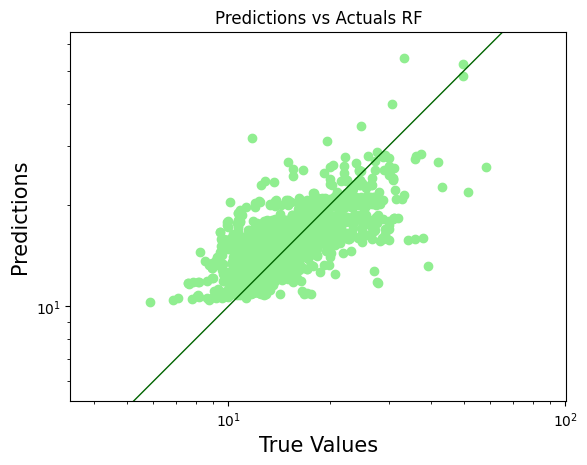

In [85]:
plt.scatter(y_test, y_pred_test, c='lightgreen')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred_test), np.max(y_test.values))
p2 = min(min(y_pred_test), np.min(y_test.values))
plt.axline((p2,p2), (p1,p1), linewidth=1, color='darkgreen')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.title('Predictions vs Actuals RF')
plt.axis('equal')
plt.show()

La verdad es que los resultados son bastante flojos, vemos que el modelo con los datos de entrenamiento sigue teniendo una R2 baja, pero esque en este caso, si además nos fijamos en la R2 de validación, se observa más sobreentrenamiento que en los casos anteriores y una R2 más baja. Además, por el tipo de funcionamiento del algortimo, es un modelo bastante más lento a nivel de tiempo de computación.

**Segundo modelo de Radnom Forest con dos niveles más de profundidad**

Seguriemos el mismo porceso que en los casos anteriores, pero ahora lo que haremos será parametrizar el modelo de tal forma que la profundidad pueda ser de hasta 8. De esta manera, creo que el sobreentrenamiento puede aumentar, pero quiero observar si la precisión del modelo también lo hace.

In [86]:
parameters = {"n_estimators":[100,150,200],
              "max_depth": [2,4,6,8],
              "min_samples_split": [2,4,6,8]}

#instantiate the classifier
rf = RandomForestRegressor()

# Grid search function
grid_rf = GridSearchCV(cv = 10, estimator=rf, param_grid=parameters, scoring="r2")
grid_rf.fit(X_train, y_train)
grid_rf.best_params_

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel(

{'max_depth': 8, 'min_samples_split': 2, 'n_estimators': 150}

In [87]:
n_estimators = grid_rf.best_params_["n_estimators"]
max_depth = grid_rf.best_params_["max_depth"]

best_rf_model = grid_rf.best_estimator_

In [88]:
# Creamos el modelo con los hiperpametros seleccionados en el punto anterior
rf = RandomForestRegressor(max_depth = max_depth, n_estimators = n_estimators)
# Entrenamos el modelo con el dataset de entrenamiento mediante cross validation
rf_cv = cross_validate(rf, X_train, y_train, cv = 10, scoring = "r2")

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel(

In [89]:
figure = px.histogram(rf_cv, x="test_score", marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f" Histograma y Boxplot de R2 del modelo de Random Forest", paper_bgcolor="white", plot_bgcolor="white")
figure.show()

In [90]:
for i, score in enumerate(rf_cv["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

Accuracy for the fold no. 0 on the test set: 0.5122507864341451
Accuracy for the fold no. 1 on the test set: 0.5441389988589576
Accuracy for the fold no. 2 on the test set: 0.5109215591839881
Accuracy for the fold no. 3 on the test set: 0.47742989093563715
Accuracy for the fold no. 4 on the test set: 0.48284971998956505
Accuracy for the fold no. 5 on the test set: 0.5587459809738335
Accuracy for the fold no. 6 on the test set: 0.5428646665959276
Accuracy for the fold no. 7 on the test set: 0.6212880208651391
Accuracy for the fold no. 8 on the test set: 0.3507151753448895
Accuracy for the fold no. 9 on the test set: 0.5603500097764846


In [91]:
y_pred_train = best_rf_model.predict(X_train)
y_pred_test = best_rf_model.predict(X_test)

In [92]:
r2_train_rf = metrics.r2_score(y_train, y_pred_train)
r2_train_rf

0.6844099660489668

In [93]:
r2_validation_rf = metrics.r2_score(y_test, y_pred_test)
r2_validation_rf

0.49741186031190654

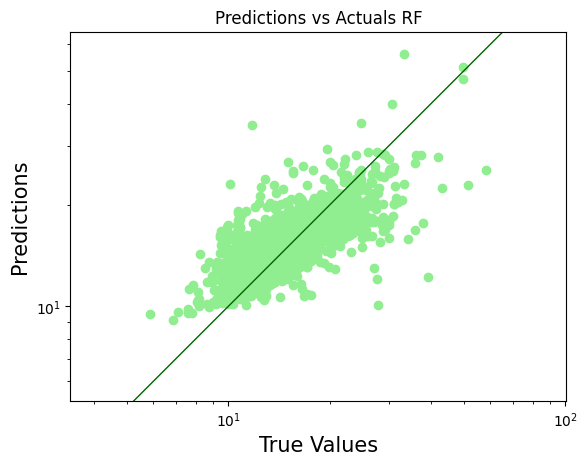

In [94]:
plt.scatter(y_test, y_pred_test, c='lightgreen')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred_test), np.max(y_test.values))
p2 = min(min(y_pred_test), np.min(y_test.values))
plt.axline((p2,p2), (p1,p1), linewidth=1, color='darkgreen')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.title('Predictions vs Actuals RF')
plt.axis('equal')
plt.show()

In [95]:
cv['Random Forest_Profundo'] = rf_cv["test_score"]
model_rf_results = ['Random Forest_Profundo', np.mean(rf_cv["test_score"]), r2_train_rf, r2_validation_rf]
results = pd.concat([results,pd.DataFrame([model_rf_results], columns=results.columns)], ignore_index=True)

results

,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.493926,0.580984,0.499071
1,decision_tree_bagging_cat,0.495956,0.590715,0.507852
2,Random Forest_Inicial,0.479112,0.579100,0.469375
3,Random Forest_Profundo,0.516155,0.684410,0.497412


Como era de esperar, el modelo se sobreentrena mucho más. Al añadir profundidad, hemos añadido mucho más detalle al modelo, y de esta forma, se aprende mucho mejor los datos de validación, y nos da una R2 muy alta para ese conjunto de datos. Sin embargo, la r2 de validación, acaba siendo incluso un poco inferior a la r2 obtenida con el segundo modelo de bagging.

**Modelo con más profundidad y estimadores**

Por último, he querido crear un caso extremo, es decir, un modelo con muchísimas más iteraciones y una profundidad elevada. La idea era ver hasta donde llegarían los resultados y conocer un poco más el funcionamiento.

In [96]:
X = data_final.drop(['precio_m2'], axis = 1)
y = data_final[['precio_m2']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=79)

In [97]:
parameters = {"n_estimators":[200,350,500],
              "max_depth": [6,10,14],
              "min_samples_split": [2,4,6]}

#instantiate the classifier
rf = RandomForestRegressor()

# Grid search function
grid_rf = GridSearchCV(cv = 10, estimator=rf, param_grid=parameters, scoring="r2")
grid_rf.fit(X_train, y_train)
grid_rf.best_params_

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel(

{'max_depth': 14, 'min_samples_split': 2, 'n_estimators': 500}

In [98]:
n_estimators = grid_rf.best_params_["n_estimators"]
max_depth = grid_rf.best_params_["max_depth"]

best_rf_model = grid_rf.best_estimator_

In [99]:
# Creamos el modelo con los hiperpametros seleccionados en el punto anterior
rf = RandomForestRegressor(max_depth = max_depth, n_estimators = n_estimators)
# Entrenamos el modelo con el dataset de entrenamiento mediante cross validation
rf_cv = cross_validate(rf, X_train, y_train, cv = 10, scoring = "r2")

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

c:\Users\Marc\AppData\Local\Programs\Python\Python312\Lib\site-packages\sklearn\base.py:1152: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel(

In [100]:
figure = px.histogram(rf_cv, x="test_score", marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f" Histograma y Boxplot de R2 del modelo de Random Forest", paper_bgcolor="white", plot_bgcolor="white")
figure.show()

In [101]:
for i, score in enumerate(rf_cv["test_score"]):
    print(f"Accuracy for the fold no. {i} on the test set: {score}")

Accuracy for the fold no. 0 on the test set: 0.5618706433096698
Accuracy for the fold no. 1 on the test set: 0.5731376161049426
Accuracy for the fold no. 2 on the test set: 0.5761346310154924
Accuracy for the fold no. 3 on the test set: 0.5088333707312336
Accuracy for the fold no. 4 on the test set: 0.5333454095478358
Accuracy for the fold no. 5 on the test set: 0.629802797957308
Accuracy for the fold no. 6 on the test set: 0.5993126836969839
Accuracy for the fold no. 7 on the test set: 0.6348558123300139
Accuracy for the fold no. 8 on the test set: 0.3707396124373682
Accuracy for the fold no. 9 on the test set: 0.587142578073351


In [102]:
y_pred_train = best_rf_model.predict(X_train)
y_pred_test = best_rf_model.predict(X_test)

In [103]:
r2_train_rf = metrics.r2_score(y_train, y_pred_train)
r2_train_rf

0.8889713611207462

In [104]:
r2_validation_rf = metrics.r2_score(y_test, y_pred_test)
r2_validation_rf

0.547435430147466

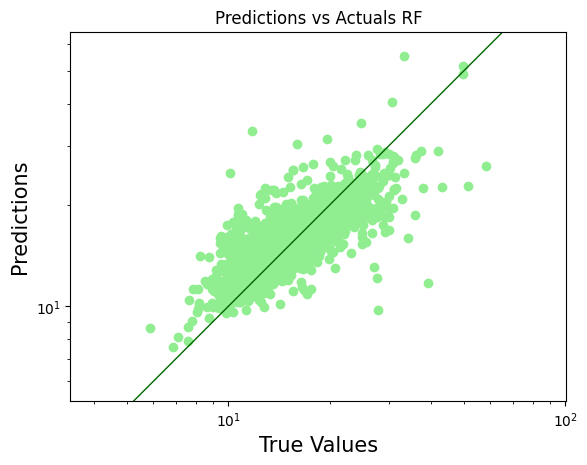

In [105]:
plt.scatter(y_test, y_pred_test, c='lightgreen')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred_test), np.max(y_test.values))
p2 = min(min(y_pred_test), np.min(y_test.values))
plt.axline((p2,p2), (p1,p1), linewidth=1, color='darkgreen')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.title('Predictions vs Actuals RF')
plt.axis('equal')
plt.show()

In [106]:
cv['Random_Forest_Extremo'] = rf_cv["test_score"]
model_rf_results = ['Random Forest_Extremo', np.mean(rf_cv["test_score"]), r2_train_rf, r2_validation_rf]
results = pd.concat([results,pd.DataFrame([model_rf_results], columns=results.columns)], ignore_index=True)

results

,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.493926,0.580984,0.499071
1,decision_tree_bagging_cat,0.495956,0.590715,0.507852
2,Random Forest_Inicial,0.479112,0.579100,0.469375
3,Random Forest_Profundo,0.516155,0.684410,0.497412
4,Random Forest_Extremo,0.557518,0.888971,0.547435


Evidentmente, los resultados del modelo con los datos de validación son bastante buenos, de hecho casi se podría decir que es un bune resultado si no fuera porque cuando nos fijamos en los valores que obtenemos al usar los datos que el modelo no ha visto, obtenemos una calidad solo ligeramente superior a las anteriores. En definitiva, como era de esperar, el modelo está memorizando los datos de entrenamineto y, por lo tanto, extremadamente sobreentrenado.

**Comparación de Modelos:**


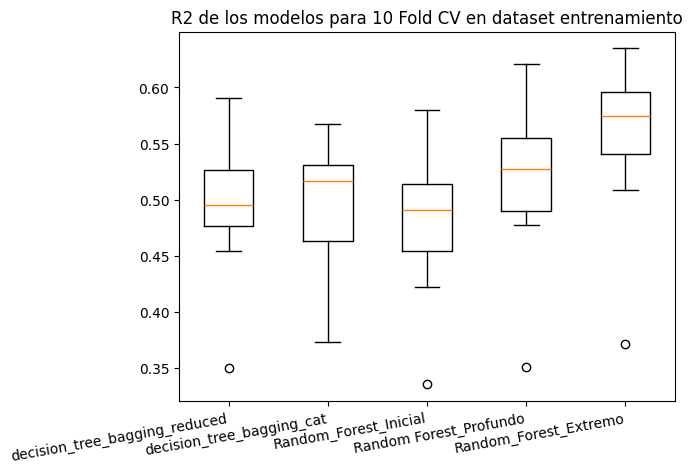

In [107]:
fig1, ax1 = plt.subplots()
ax1.set_title('R2 de los modelos para 10 Fold CV en dataset entrenamiento')
ax1.boxplot(pd.DataFrame(cv))
ax1.set_xticklabels(cv.keys(), rotation=10, ha="right")

plt.show()

Con estos gráficos observamos los distintos valores que hemos ido obteniendo con todos los modelos creados. Es curioso observar que todos ellos excepto el segundomodelo de bagging creado tienen un fold con datos muy extremos y que da unos resultados muy malos. A parte de esto, y sabiendo el sobreentrenamiento que tienen los últimos dos modelos, no parece que hayamos encontrado aún ningún modelo suficientemente bueno.

# Boosting

El siguiente modelo que crearemos es el modelo de Boosting, para ello, usaremos el algoritmo CatBoost. Hay que tener en cuenta algunos detalles respecto a este algoritmo:
- Para usarlo vamos a tener que usar un formato concreto de datos, adaptado a la librería, así que tendremos que transformarlos
- Este algoritmo acepta variables categóricas, por lo que no hará falta usar el dataset "data_final". Usaremos el data_clean donde tenemos todas las variables y las categóricas sin el one-hot encoding

In [109]:
data_clean.head()

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,furniture,garage,property_type,garden,dist_closest_station,distrito,year_built_class,precio_m2,habs_m2,baños_m2
0,0.0,0.0,1.0,norte,2.0,0.0,0.0,0.0,1.0,desconocida,...,muebles,0.0,piso,0.0,0.094111,Gràcia,Desconocido,15.454545,0.036364,0.018182
1,1.0,0.0,1.0,sur,3.0,0.0,1.0,0.0,1.0,desconocida,...,desconocida,0.0,piso,0.0,0.902561,Sarrià-Sant Gervasi,1930-1962,19.594595,0.054054,0.027027
2,0.0,0.0,1.0,desconocida,4.0,0.0,1.0,0.0,1.0,desconocida,...,muebles,0.0,piso,0.0,0.188177,Horta-Guinardó,Desconocido,13.194444,0.041667,0.013889
3,1.0,0.0,1.0,norte,4.0,0.0,1.0,0.0,0.0,desconocida,...,muebles,0.0,piso,0.0,0.892917,Sarrià-Sant Gervasi,1930-1962,16.666667,0.022222,0.022222
4,0.0,0.0,1.0,sur,3.0,0.0,1.0,0.0,0.0,gas,...,muebles,0.0,piso,0.0,0.293784,Sarrià-Sant Gervasi,Desconocido,22.000000,0.022222,0.022222


In [110]:
data_clean.shape

(8500, 21)

In [111]:
X = data_clean.drop(['precio_m2'], axis = 1)
y = data_clean[['precio_m2']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=79)

In [112]:
# Transformamos los datos y los ponemos en el formato del algoritmo
train_cat = cat.Pool(X_train, y_train, cat_features = categoricas)
test_cat = cat.Pool(X_test, y_test, cat_features = categoricas)

In [113]:
# Parametrizamos el modelo
model = cat.CatBoostRegressor()

grid = {'learning_rate': [0.05, 0.03, 0.015, 0.005],
        'depth': [2, 4, 6, 8]}

grid_search_result = model.grid_search(grid, train_cat, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 16.1250203	test: 16.3317582	best: 16.3317582 (0)	total: 161ms	remaining: 2m 40s
1:	learn: 15.4100446	test: 15.6189693	best: 15.6189693 (1)	total: 171ms	remaining: 1m 25s
2:	learn: 14.7384202	test: 14.9522876	best: 14.9522876 (2)	total: 186ms	remaining: 1m 1s
3:	learn: 14.1040674	test: 14.3254170	best: 14.3254170 (3)	total: 201ms	remaining: 50s
4:	learn: 13.5091211	test: 13.7347228	best: 13.7347228 (4)	total: 216ms	remaining: 43.1s
5:	learn: 12.9486796	test: 13.1790177	best: 13.1790177 (5)	total: 228ms	remaining: 37.8s
6:	learn: 12.4140352	test: 12.6488980	best: 12.6488980 (6)	total: 248ms	remaining: 35.3s
7:	learn: 11.9044188	test: 12.1419506	best: 12.1419506 (7)	total: 265ms	remaining: 32.8s
8:	learn: 11.4196683	test: 11.6599853	best: 11.6599853 (8)	total: 280ms	remaining: 30.9s
9:	learn: 10.9558352	test: 11.1934157	best: 11.1934157 (9)	total: 296ms	remaining: 29.3s
10:	learn: 10.5384877	test: 10.7776444	best: 10.7776444 (10)	total: 311ms	remaining: 28s
11:	learn: 10.1411752

108:	learn: 4.2414757	test: 4.2627656	best: 4.2627656 (108)	total: 2.1s	remaining: 17.2s
109:	learn: 4.2391729	test: 4.2580267	best: 4.2580267 (109)	total: 2.12s	remaining: 17.2s
110:	learn: 4.2362291	test: 4.2543250	best: 4.2543250 (110)	total: 2.14s	remaining: 17.2s
111:	learn: 4.2345311	test: 4.2514102	best: 4.2514102 (111)	total: 2.16s	remaining: 17.2s
112:	learn: 4.2321132	test: 4.2470323	best: 4.2470323 (112)	total: 2.2s	remaining: 17.2s
113:	learn: 4.2294443	test: 4.2403136	best: 4.2403136 (113)	total: 2.22s	remaining: 17.2s
114:	learn: 4.2263464	test: 4.2378134	best: 4.2378134 (114)	total: 2.24s	remaining: 17.3s
115:	learn: 4.2240379	test: 4.2361330	best: 4.2361330 (115)	total: 2.27s	remaining: 17.3s
116:	learn: 4.2210830	test: 4.2293427	best: 4.2293427 (116)	total: 2.29s	remaining: 17.3s
117:	learn: 4.2182967	test: 4.2266321	best: 4.2266321 (117)	total: 2.3s	remaining: 17.2s
118:	learn: 4.2153128	test: 4.2233033	best: 4.2233033 (118)	total: 2.32s	remaining: 17.2s
119:	learn: 4

Empezamos dando una serie de parametros al modelo para que, gracias al Grid Serach, nos de los parámetros que mejores resultados dan para el modelo que queremos crear. Es interesante ver que no siempre deberemos escoger los paraemtros que nos den el mejor resultado ya que en la mayoría de casos, este suele ser un punto en el que la diferencia entre el test y el train es muy grande y por tanto, pese a darnos un mínimo para los datos de train, con esos parametros lo que haremos es sobreentrenar el modelo y perder robustez.

Para nuestro caso, he escogido el punto con una profundiad de 6 y un learning rate de 0.015, ya que es el valor más bajo de los puntso en los que no hay una diferencia abismal entre los resultados de train y de test.

In [114]:
# Model cross validation
params = {"iterations": 1800
          , "depth": 6
          , "loss_function": "RMSE"
          , "learning_rate": 0.015
          , "verbose": False
          , "subsample": 0.7}

scores = cat.cv(train_cat
            , params
            , fold_count = 10
            , plot = "True")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]

bestTest = 3.899027979
bestIteration = 1799

Training on fold [1/10]

bestTest = 4.459733898
bestIteration = 1798

Training on fold [2/10]

bestTest = 3.501122291
bestIteration = 1673

Training on fold [3/10]

bestTest = 3.419081926
bestIteration = 1798

Training on fold [4/10]

bestTest = 3.45338799
bestIteration = 1797

Training on fold [5/10]

bestTest = 3.727804594
bestIteration = 1798

Training on fold [6/10]

bestTest = 3.35043293
bestIteration = 1799

Training on fold [7/10]

bestTest = 4.04149778
bestIteration = 1793

Training on fold [8/10]

bestTest = 3.404794721
bestIteration = 1798

Training on fold [9/10]

bestTest = 3.853205997
bestIteration = 1799



Una vez seleccionemos los mejores parámetros, usaremos el Cross Validation para crear 10 folds de validación. Con estos, lo que obtendremos son los resultados de de distintos folds y podremos ver gracias al gráfico, el número óptimo de iteraciones para el modelo que queremos crear. Es interesante intentar buscar la mejor iteración o el punto en el que el modelo empieza a sobreentrenarse como referencia para entender la cantidad de iteraciones que necesitaremos introducir cuando creemos el modelo.

Una vez tenemos claros los parámetros que queremos seleccionar y el número de iteraciones más cercano al óptimo, podemos crear definitivamente nuestro modelo CatBoost añadiendo todas estas características y visualizándolo.

In [115]:
model_cat = cat.CatBoostRegressor(iterations = 1650
                                  , learning_rate = 0.015
                                  , loss_function = "RMSE"
                                  , random_seed = 79
                                  , depth = 6
                                  , subsample=0.7)

model_cat.fit(train_cat
                , eval_set = test_cat
                , verbose_eval=500
                , plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 5.6012907	test: 5.1042029	best: 5.1042029 (0)	total: 69.7ms	remaining: 1m 54s
500:	learn: 3.6806374	test: 3.5583010	best: 3.5583010 (500)	total: 21.2s	remaining: 48.7s
1000:	learn: 3.3871099	test: 3.4668712	best: 3.4668712 (1000)	total: 42.9s	remaining: 27.8s
1500:	learn: 3.1993243	test: 3.4065334	best: 3.4064213 (1471)	total: 1m 3s	remaining: 6.32s
1649:	learn: 3.1527857	test: 3.3939271	best: 3.3938957 (1648)	total: 1m 10s	remaining: 0us

bestTest = 3.393895669
bestIteration = 1648

Shrink model to first 1649 iterations.


In [116]:
# Predicción con los datos train
y_pred_train_cat1 = model_cat.predict(X_train)
r2_train_cat = metrics.r2_score(y_train, y_pred_train_cat1)

# Predicción con los datos train
y_pred_test_cat1 = model_cat.predict(X_test)
r2_test_cat = metrics.r2_score(y_test, y_pred_test_cat1)

print('R2 para la predicción con los datos train: ', r2_train_cat)
print('R2 para la predicción con los datos test: ', r2_test_cat)
print('Diferencias entre los datos de train y test: ', r2_train_cat - r2_test_cat)

R2 para la predicción con los datos train:  0.6754960295598782
R2 para la predicción con los datos test:  0.5614102631735729
Diferencias entre los datos de train y test:  0.1140857663863053


In [117]:
# Guardamos los resultados de RF
model_catboost_results = ['Catboost_1', np.nan, r2_train_cat, r2_test_cat]
results = pd.concat([results,pd.DataFrame([model_catboost_results], columns=results.columns)], ignore_index=True)

results

,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.493926,0.580984,0.499071
1,decision_tree_bagging_cat,0.495956,0.590715,0.507852
2,Random Forest_Inicial,0.479112,0.579100,0.469375
3,Random Forest_Profundo,0.516155,0.684410,0.497412
4,Random Forest_Extremo,0.557518,0.888971,0.547435
5,Catboost_1,NaN,0.675496,0.561410


Se observa que el modelo creado es algo mejor modelo que los anteriores ya que la R2 es un poco superior y los niveles de sobreentrenamiento no aumentan demasiado si comparamos con los otros modelos que hemos creado, aún así las diferencias siguen siendo grandes y no parece que sea un modelo demasiado robusto. 

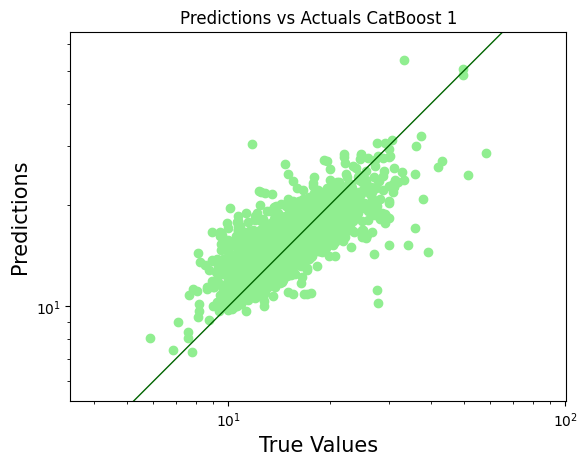

In [118]:
plt.scatter(y_test, y_pred_test_cat1, c='lightgreen')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred_test_cat1), np.max(y_test.values))
p2 = min(min(y_pred_test_cat1), np.min(y_test.values))
plt.axline((p2,p2), (p1,p1), linewidth=1, color='darkgreen')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.title('Predictions vs Actuals CatBoost 1')
plt.axis('equal')
plt.show()

**Segundo Modelo CatBoost**

Como en los casos anteriores, he querido probar cosas distintas para ver como variaban (o no) los resultados y consecuentemente el análisis, así que he creado un modelo más con una parametrización algo distinta. En este caso he limitado los learning rates a los dos valores más altos del anterior GridSearch y, como en el caso de RandomForest, he aumentado la profundidad posible.

In [ ]:
# Parametrizamos el modelo
model = cat.CatBoostRegressor()

grid = {'learning_rate': [0.03, 0.015],
        'depth': [4, 6, 8, 10, 12]}

grid_search_result = model.grid_search(grid, train_cat, plot=True)

Para este caso vuelve a ser un poco complejo escoger entre la ñmejor parametrización. Si bien es cierto que hay diversos mínimos locales muy marcados, en esos puntos el modelo estará muy sobreeentrenado ya que la diferencia entre los resultados  es muy grande. Debido a esto, he escogido unos paarámetros en los que he consdirado que hay un equilibro entre la precisión y el equilibrio con el posible sobreentrenamiento. 

In [ ]:
# Model cross validation
params = {"iterations": 1666
          , "depth": 8
          , "loss_function": "RMSE"
          , "learning_rate": 0.015
          , "verbose": False
          , "subsample": 0.7}

scores = cat.cv(train_cat
            , params
            , fold_count = 10
            , plot = "True")

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/10]



bestTest = 3.823973429
bestIteration = 1665

Training on fold [1/10]

bestTest = 4.451494758
bestIteration = 1663

Training on fold [2/10]

bestTest = 3.472329801
bestIteration = 1660

Training on fold [3/10]

bestTest = 3.379747816
bestIteration = 1665

Training on fold [4/10]

bestTest = 3.422345036
bestIteration = 1665

Training on fold [5/10]

bestTest = 3.641173251
bestIteration = 1663

Training on fold [6/10]

bestTest = 3.256152035
bestIteration = 1665

Training on fold [7/10]

bestTest = 4.002352976
bestIteration = 1665

Training on fold [8/10]

bestTest = 3.376640005
bestIteration = 1665

Training on fold [9/10]

bestTest = 3.832832404
bestIteration = 1665



In [ ]:
model_cat_2 = cat.CatBoostRegressor(iterations = 1660
                                  , learning_rate = 0.015
                                  , loss_function = "RMSE"
                                  , random_seed = 79
                                  , depth = 8
                                  , subsample=0.7)

model_cat_2.fit(train_cat
                , eval_set = test_cat
                , verbose_eval=500
                , plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 5.6000587	test: 5.1034963	best: 5.1034963 (0)	total: 63ms	remaining: 1m 51s


500:	learn: 3.4296297	test: 3.4802306	best: 3.4802306 (500)	total: 29s	remaining: 1m 13s
1000:	learn: 3.0598520	test: 3.3768070	best: 3.3768070 (1000)	total: 58.7s	remaining: 44.9s
1500:	learn: 2.8126137	test: 3.3231792	best: 3.3231792 (1500)	total: 1m 29s	remaining: 15.8s
1765:	learn: 2.6960932	test: 3.3066271	best: 3.3066099 (1764)	total: 1m 50s	remaining: 0us

bestTest = 3.306609866
bestIteration = 1764

Shrink model to first 1765 iterations.


In [ ]:
# Predicción con los datos train
y_pred_train_2 = model_cat_2.predict(X_train)
r2_train_cat_2 = metrics.r2_score(y_train, y_pred_train_2)

# Predicción con los datos test
y_pred_test_cat2 = model_cat_2.predict(X_test)
r2_test_cat_2 = metrics.r2_score(y_test, y_pred_test_cat2)

print('R2 para la predicción con los datos train: ', r2_train_cat_2)
print('R2 para la predicción con los datos test: ', r2_test_cat_2)
print('Diferencias entre los datos de train y test: ', r2_train_cat_2 - r2_test_cat_2)

R2 para la predicción con los datos train:  0.7454591201013079
R2 para la predicción con los datos test:  0.583679875404556
Diferencias entre los datos de train y test:  0.16177924469675187


In [ ]:
# Guardamos los resultados de RF
model_catboost_results = ['Catboost_2', np.nan, r2_train_cat_2, r2_test_cat_2]
results = pd.concat([results,pd.DataFrame([model_catboost_results], columns=results.columns)], ignore_index=True)

results

,model,mean_r2_cv_test,r2_train,r2_validation
0,decision_tree_bagging_reduced,0.494725,0.580512,0.499048
1,decision_tree_bagging_cat,0.495895,0.592238,0.510256
2,Random Forest_Inicial,0.481287,0.577459,0.467774
3,Random Forest_Profundo,0.515912,0.681800,0.499011
4,Random Forest_Extremo,0.556583,0.889594,0.545611
5,Catboost_1,NaN,0.677466,0.562140
6,Catboost_2,NaN,0.745459,0.583680


Se observa en la diferencia de los resultados que tenemos un más que evidente overfitting, mayor incluso que en el caso previo. Nuestro modelo da un resultado "correcto" para los datos de train, pero no es capaz de generalizar, y en el momento que le pasamos unos datos que desconoce, los resultados son bastante peores. 

Hay que tener en cuenta que existen diversos factores a la hora de analizar porque sucede esto. El más evidente, si nos fijamos en los dos modelos que hemos provado es que el aumento de profundidad nos genera sobreentrenamiento. Por otro lado, es probable que, reduciendo el número de iteraciones, obtendríamos un resultado peor pero la diferencia entre las R2 sería menor (lo he provado y así sucede), también se podría provar de optimizar algun parámetro más de los que no he modificado y observar los resultados.

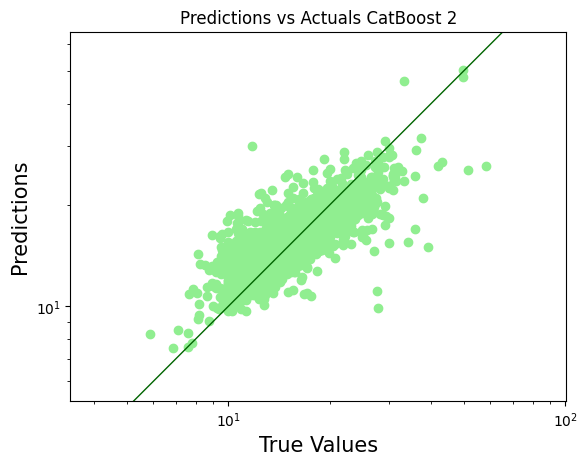

In [ ]:
plt.scatter(y_test, y_pred_test_cat2, c='lightgreen')
plt.yscale('log')
plt.xscale('log')
p1 = max(max(y_pred_test_cat2), np.max(y_test.values))
p2 = min(min(y_pred_test_cat2), np.min(y_test.values))
plt.axline((p2,p2), (p1,p1), linewidth=1, color='darkgreen')
plt.xlabel('True Values', fontsize=15)
plt.ylabel('Predictions', fontsize=15)
plt.title('Predictions vs Actuals CatBoost 2')
plt.axis('equal')
plt.show()

**Importancia de las variables en los modelos**

Por último, creo que nos puede aportar mucha información intentar analizar que variables tienen un impacto mayor en nuestras predicciones.

In [120]:
cat_importance = pd.DataFrame({"Variables": model_cat.feature_names_
                               , "Importancia": model_cat.feature_importances_}
                             ).sort_values('Importancia', ascending=False)
cat_importance

,Variables,Importancia
19,baños_m2,29.903978
10,dist_city_center,10.506868
8,ac,9.144132
7,pool,9.101777
16,distrito,8.639352
15,dist_closest_station,5.880244
4,floor,5.082730
18,habs_m2,4.996464
13,property_type,3.122974
9,heating,2.747391


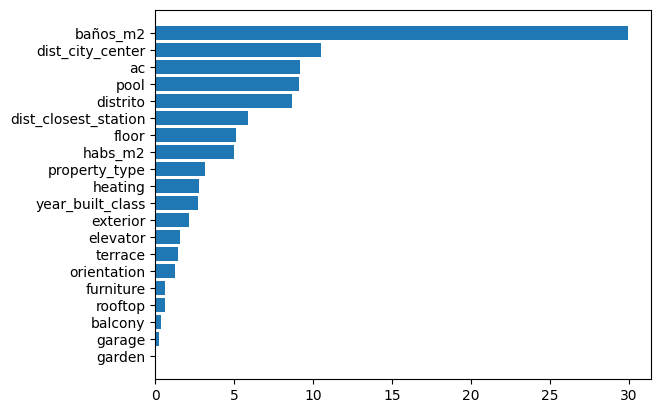

In [121]:
plt.rcdefaults()
fig, ax = plt.subplots()

ax.barh(y = 'Variables'
        , width = 'Importancia'
        , data = cat_importance)
ax.invert_yaxis()  

Con este gráfico vemos la importancia de las variables que usamos en el modelo. En este caso, se observa que los baños por metro cuadrado tienen una importancia enorme, muy por encima de las demás. Como vimos en clase, esto no siempre puede ser ideal ya que nos puede estar ocultando efectos de otras variables y opacandolos.

# Shap Values

Consideraremos el mejor modelo el primero que hemos creado para Catboost. Aunque el resultado final es mejor el del segundo, si tenemos en cuenta el sobreentrenamiento, el este tiene muchisimo más así que es mucho menos robusto y la realidad es que la diferencia el R2 de validación es muy pequeña.

A partir de este punto, lo que intentaremos será analizar los Shap Values de este modelo y ver que variables tienen más importancia en nuestro modelo y como afectan al resultado final, es decir, como afectan a nuestras predicciones.

In [122]:
X = data_clean.drop(['precio_m2'], axis = 1)
y = data_clean[['precio_m2']]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=79)

# Cálculo Shap Values
explainer_cat = shap.TreeExplainer(model_cat)
shap_values_cat = explainer_cat.shap_values(X_train)

In [123]:
print("Attributes")
print("")
print(X_train.iloc[0,:])
print("")
print("Price")
print("")
print(y_train.iloc[0,0])

Attributes

balcony                         0.0
terrace                         0.0
exterior                        0.0
orientation             desconocida
floor                           0.0
rooftop                         0.0
elevator                        1.0
pool                            0.0
ac                              0.0
heating                 desconocida
dist_city_center           4.528773
furniture               desconocida
garage                          0.0
property_type                  piso
garden                          0.0
dist_closest_station       0.564225
distrito                Sant Andreu
year_built_class        Desconocido
habs_m2                    0.042553
baños_m2                   0.010638
Name: 7722, dtype: object

Price

9.680851063829786


Este es un primer ejemplo, de la primera observación del dataset en el que observamos todas las características del piso.

Es un "mal" piso ya que esta lejos del centro y tiene pocos añadidos. Por lo que sabemos no tiene ninguna de las siguientes características que puede añadir valor a un piso: valcón, terraza, exterior, rooftop, piscina, aire acondicionado, parking o jardín. Además, hay muchas otras que desconocemos si las tiene o no, así que esto tampoco va a añadirle demasiado valor al piso. 

De hecho, con este primer análisis lógico, parece tener sentido el precio que tiene, es un precio muy por debajo de la media y que se puede consdierar barato. Veamos el análisis de los Shap values para intentar entender que características le ayudan a aumentar su precio y cuáles le restan valor.

In [124]:
print("CATBoost Shap Primera Observación")
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0,:], X_train.iloc[0,:])

CATBoost Shap Primera Observación


Realmente este análisis es muy interesante y, en parte, confirma un poco lo que estabamos diciendo en el apartado anterior. Vemos que el precio de el apartamento es de 9,82 y en base a eso, que impacto tiene cada variable para hacer que el valor de este acaba siendo más de seis puntos por debajo del 'base value'. 

La variable que afecta más negativamente al precio es el hecho que tan solo haya 0.01 baños por metro cuadrado (como también hemos visto en el gráfico de las variables), por otro lado, nuestro modelo valora también negativamente el hecho que este en el distrito de Sant Andreu, así como que no haya aire acondicionado o que la distancia al centro sea de 4,5 kms.

Por otro lado, algunas variables afectan un poco positivamente al precio, la que más es el hecho de no conocer el año de construcción del piso, lo cuál es un poco difícil de interpretar, pero la verdad es que el incremento en el valor del piso gracias a esto es muy pequeño.

In [125]:
# Forceplot para las primeras 500 observaciones
shap.force_plot(explainer_cat.expected_value, shap_values_cat[0:500], X_train[0:500])

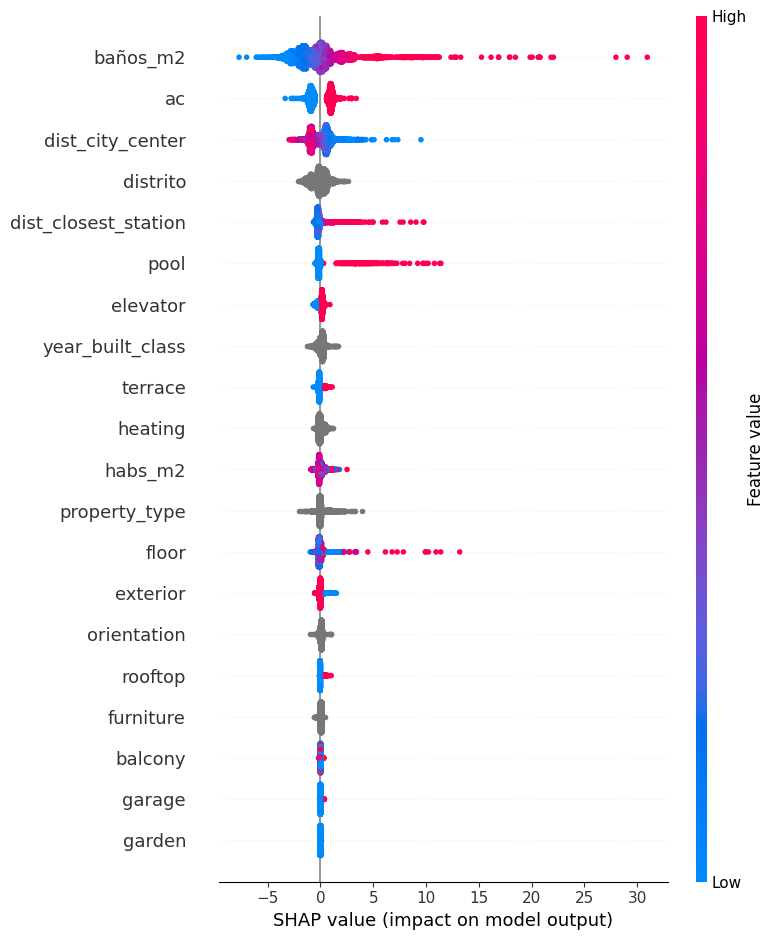

In [126]:
# Summary plot
shap.summary_plot(shap_values_cat, X_train)

Este gráfico es muy interesante para analizar el impacto de cada variable en las predicciones finales de nuestro modelo. Por ejemplo, se observa claramente que como más baños por metro cuadrado tienen una observación (un piso) , más positivamente impacta esta variable a la predicción. Es decir, si el modelo fuera muy preciso, más caro será el alquiler de este piso.

Un ejemplo en la dirección opuesta, también vemos que cuanto menos distancia haya al centro de la ciudad desde el apartamento que estamos analizando, , mayor será la predicción del precio de este apartamento. Hay algunas variables en las que no tenemos  resultaods ya que son variables categoricas con texto y no se puede calcular.

# Data Set Ventas

**Limpieza de datos**

Por último, ahora vamos a incroporar el data set de ventas con más pisos y todas sus características, vamos a hacer de nuevo una limpieza prácticamente identica a la limpieza que realizada al inicio de este trabajo y vamos a aplicar nuestro mejor modelo (para hacer predicciones sobre estos nuevos pisos.

In [127]:
data_sale = pd.read_csv('0_processed_sale_Barcelona.csv', delimiter = ',')
data_sale.head()

,id,price,currency,latitude,longitude,sq_meters,sq_meters_built,rooms,bathrooms,balcony,...,neighborhood,dist_city_center,furniture,garage,property_type,garden,closest_station,dist_closest_station,created_at,last_seen
0,320294,150000,€,41.459649,2.174793,63.0,67,3,1,NaN,...,Ciutat Meridiana - Torre Baró - Vallbona,7.990993,NaN,NaN,piso,NaN,Ciutat Meridiana,0.121438,9/3/2021 10:16,11/12/2021 13:50
1,1786997,150000,€,41.422081,2.155370,48.0,52,2,1,NaN,...,El Carmel,3.991000,NaN,NaN,piso,NaN,El Carmel,0.277336,9/3/2021 10:16,11/12/2021 13:50
2,1787143,395000,€,41.402928,2.207851,84.0,91,2,2,NaN,...,El Poblenou,3.579261,NaN,NaN,duplex,NaN,Poblenou,0.383878,8/30/2021 12:17,8/30/2021 12:17
3,1976767,540000,€,41.394692,2.144422,NaN,100,3,1,NaN,...,Sant Gervasi - Galvany,2.257852,NaN,1.0,piso,NaN,Hospital Clínic,0.875652,9/1/2021 14:04,9/2/2021 13:50
4,27972575,650000,€,41.398971,2.120754,NaN,141,3,2,NaN,...,Sarrià,4.283368,NaN,1.0,piso,NaN,Maria Cristina,1.310073,8/29/2021 11:47,9/2/2021 11:01


In [128]:
data_sale.isnull().sum()

id                         0
price                      0
currency                   0
latitude                   0
longitude                  0
sq_meters               2573
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                 3637
terrace                 4419
exterior                1077
orientation             2713
floor                   2082
rooftop                 5440
elevator                 571
doorman                 5847
pool                    5677
ac                      3198
heating                 2490
year_built              1765
quality                    0
city                       0
neighborhood               0
dist_city_center           0
furniture               5847
garage                  5442
property_type              2
garden                  5786
closest_station            0
dist_closest_station       0
created_at                 0
last_seen                  0
dtype: int64

In [129]:
data_sale_clean = data_sale.drop(columns = ['quality','id','latitude', 'longitude','currency','doorman','sq_meters','city','closest_station','created_at','last_seen'])

In [130]:
data_sale_clean.describe()

,price,sq_meters_built,rooms,bathrooms,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,year_built,dist_city_center,furniture,garage,garden,dist_closest_station
count,5.847000e+03,5847.000000,5847.000000,5847.000000,2210.0,1428.0,4770.000000,3765.000000,407.0,5276.000000,170.0,2649.0,4082.000000,5847.000000,0.0,405.0,61.0,5847.000000
mean,3.675277e+05,86.796990,2.595177,1.419873,1.0,1.0,0.873166,3.197078,1.0,0.632108,1.0,1.0,1954.557080,3.501169,NaN,1.0,1.0,0.361633
std,5.297097e+05,67.540444,1.155746,0.804772,0.0,0.0,0.332822,2.350061,0.0,0.482278,0.0,0.0,36.545538,2.023326,NaN,0.0,0.0,0.286081
min,2.800000e+04,10.000000,0.000000,1.000000,1.0,1.0,0.000000,1.000000,1.0,0.000000,1.0,1.0,1769.000000,0.074264,NaN,1.0,1.0,0.003595
25%,1.350000e+05,55.000000,2.000000,1.000000,1.0,1.0,1.000000,1.000000,1.0,0.000000,1.0,1.0,1940.000000,1.756057,NaN,1.0,1.0,0.213786
50%,1.920000e+05,69.000000,3.000000,1.000000,1.0,1.0,1.000000,3.000000,1.0,1.000000,1.0,1.0,1965.000000,3.380517,NaN,1.0,1.0,0.312345
75%,3.950000e+05,93.000000,3.000000,2.000000,1.0,1.0,1.000000,4.000000,1.0,1.000000,1.0,1.0,1973.000000,4.901766,NaN,1.0,1.0,0.422905
max,9.500000e+06,970.000000,11.000000,9.000000,1.0,1.0,1.000000,25.000000,1.0,1.000000,1.0,1.0,2022.000000,8.627149,NaN,1.0,1.0,4.203571


In [131]:
data_sale_clean.describe(include="O").T

,count,unique,top,freq
orientation,3134,4,sur,1423
heating,3357,5,gas,1350
neighborhood,5847,75,Nou Barris,360
property_type,5845,8,piso,5111


In [132]:
data_sale_clean['furniture'].describe().T

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: furniture, dtype: float64

In [133]:
# Definir la asignación de barrios a distritos
asignacion_distritos = {
    'Gràcia': 'Gràcia',
    'Sant Gervasi - La Bonanova': 'Sarrià-Sant Gervasi',
    'El Baix Guinardó': 'Horta-Guinardó',
    'Sarrià-Sant Gervasi': 'Sarrià-Sant Gervasi',
    'Hostafrancs': 'Sants-Montjuïc',
    'Vila de Gràcia': 'Gràcia',
    'La Sagrada Família': 'Eixample',
    'El Poblenou': 'Sant Martí',
    'Eixample': 'Eixample',
    'Sants - Badal': 'Sants-Montjuïc',
    'Sants': 'Sants-Montjuïc',
    "La Nova Esquerra de l'Eixample": 'Eixample',
    'Sant Gervasi - Galvany': 'Sarrià-Sant Gervasi',
    'El Fort Pienc': 'Eixample',
    "L'Antiga Esquerra de l'Eixample": 'Eixample',
    'El Poble Sec - Parc de Montjuïc': 'Sants-Montjuïc',
    'El Guinardó': 'Horta-Guinardó',
    'Les Tres Torres': 'Sarrià-Sant Gervasi',
    'La Barceloneta': 'Ciutat Vella',
    "El Camp d'En Grassot i Gràcia Nova": 'Gràcia',
    'El Putxet i el Farró': 'Sarrià-Sant Gervasi',
    'Horta': 'Horta-Guinardó',
    "El Camp de l'Arpa del Clot": 'Sant Martí',
    'Navas': 'Sant Andreu',
    'Provençals del Poblenou': 'Sant Martí',
    'El Coll': 'Horta-Guinardó',
    "La Dreta de l'Eixample": 'Eixample',
    'Ciutat Vella': 'Ciutat Vella',
    'Les Corts': 'Les Corts',
    'Vilapicina i la Torre Llobeta': 'Sant Andreu',
    'Vallcarca i els Penitents': 'Gràcia',
    'El Raval': 'Ciutat Vella',
    'La Prosperitat': 'Nou Barris',
    'Sant Antoni': 'Eixample',
    'Sant Pere - Santa Caterina i la Ribera': 'Ciutat Vella',
    'Can Baró': 'Horta-Guinardó',
    'El Gòtic': 'Ciutat Vella',
    'La Vila Olímpica del Poblenou': 'Sant Martí',
    'La Sagrera': 'Sant Andreu',
    'Horta Guinardó': 'Horta-Guinardó',
    'El Carmel': 'Horta-Guinardó',
    'Sarrià': 'Sarrià-Sant Gervasi',
    'La Maternitat i Sant Ramon': 'Les Corts',
    'Sant Andreu': 'Sant Andreu',
    'Nou Barris': 'Nou Barris',
    'La Guineueta': 'Nou Barris',
    'La Salut': 'Gràcia',
    'Sants-Montjuïc': 'Sants-Montjuïc',
    'La Bordeta': 'Sants-Montjuïc',
    'Pedralbes': 'Les Corts',
    'Porta': 'Horta-Guinardó',
    'El Congrés i els Indians': 'Nou Barris',
    'La Font de la Guatlla': 'Sants-Montjuïc',
    'Diagonal Mar i el Front Marítim del Poblenou': 'Sant Martí',
    'El Clot': 'Sant Martí',
    "La Font d'En Fargues": 'Horta-Guinardó',
    'El Besòs': 'Sant Martí',
    'Sant Martí de Provençals': 'Sant Martí',
    'Sant Genís Dels Agudells - Montbau': 'Horta-Guinardó',
    'El Parc i la Llacuna del Poblenou': 'Sant Martí',
    "La Vall d'Hebron - La Clota": 'Horta-Guinardó',
    'El Bon Pastor': 'Sant Andreu',
    'Can Peguera - El Turó de la Peira': 'Nou Barris',
    'Sant Martí': 'Sant Martí',
    'La Marina del Port': 'Sants-Montjuïc',
    'Verdun': 'Nou Barris',
    'La Marina del Prat Vermell': 'Sants-Montjuïc',
    'Ciutat Meridiana - Torre Baró - Vallbona': 'Nou Barris',
    'La Verneda i la Pau': 'Sant Martí',
    'La Trinitat Vella': 'Nou Barris',
    'Les Roquetes': 'Nou Barris',
    'Vallvidrera - El Tibidabo i les Planes': 'Sarrià-Sant Gervasi',
    'Canyelles': 'Nou Barris',
    'La Trinitat Nova': 'Nou Barris',
    'Baró de Viver': 'Sant Andreu',
    'La Teixonera': 'Horta-Guinardó'
}

# Crear una nueva columna en tu conjunto de datos con los distritos asignados
data_sale_clean['distrito'] = data_sale_clean['neighborhood'].map(asignacion_distritos)

# Verificar los resultados
data_sale_clean[['neighborhood', 'distrito']].head()


,neighborhood,distrito
0,Ciutat Meridiana - Torre Baró - Vallbona,Nou Barris
1,El Carmel,Horta-Guinardó
2,El Poblenou,Sant Martí
3,Sant Gervasi - Galvany,Sarrià-Sant Gervasi
4,Sarrià,Sarrià-Sant Gervasi


In [134]:
# Obtener la cantidad de barrios únicos antes de la asignación
barrios_originales = len(data_sale_clean['neighborhood'].unique())

# Obtener la cantidad de distritos únicos después de la asignación
distritos_asignados = len(asignacion_distritos)

# Verificar si la cantidad de barrios únicos es igual a la cantidad de distritos únicos
if barrios_originales == distritos_asignados:
    print("La asignación se ha realizado correctamente para todos los barrios.")
else:
    print("Asegúrate de que todos los barrios estén incluidos en la asignación.")


Asegúrate de que todos los barrios estén incluidos en la asignación.


In [135]:
data_sale_clean = data_sale_clean.drop(columns = 'neighborhood')

In [136]:
fill_na = ['balcony', 'terrace', 'exterior', 'floor', 'rooftop', 'elevator', 'pool', 'ac', 'garage', 'garden'] 
for i in range(0,len(fill_na)):
   data_sale_clean[fill_na[i]].fillna(0, inplace = True) 
data_sale_clean.isnull().sum()

price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                    0
terrace                    0
exterior                   0
orientation             2713
floor                      0
rooftop                    0
elevator                   0
pool                       0
ac                         0
heating                 2490
year_built              1765
dist_city_center           0
furniture               5847
garage                     0
property_type              2
garden                     0
dist_closest_station       0
distrito                   0
dtype: int64

In [137]:
data_sale_clean = data_sale_clean.dropna(subset=['property_type'])

In [138]:
data_desconocida = ['orientation','heating','furniture'] 
for i in range(0,len(data_desconocida)):
   data_sale_clean[data_desconocida[i]].fillna('desconocida', inplace = True) 
   
data__sale_clean = data_sale_clean.dropna(subset=['property_type'])

data_sale_clean.isnull().sum()

C:\Users\Marc\AppData\Local\Temp\ipykernel_2676\230269201.py:3: FutureWarning:

Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value 'desconocida' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.



price                      0
sq_meters_built            0
rooms                      0
bathrooms                  0
balcony                    0
terrace                    0
exterior                   0
orientation                0
floor                      0
rooftop                    0
elevator                   0
pool                       0
ac                         0
heating                    0
year_built              1765
dist_city_center           0
furniture                  0
garage                     0
property_type              0
garden                     0
dist_closest_station       0
distrito                   0
dtype: int64

In [139]:
# Contar los valores 'NA' en la variable 'heating'
na_count = data_sale_clean['heating'].value_counts().get('na', 0)

# Imprimir el resultado
print(f"Cantidad de valores 'NA' en la variable 'heating': {na_count}")


Cantidad de valores 'NA' en la variable 'heating': 981


In [140]:
# Reemplazar 'na' con 'no_heating'
data_clean['heating'] = data_clean['heating'].replace('na', 'no_heating')

# Verificar los resultados
data_clean['heating'].value_counts()


heating
desconocida    3030
gas            1700
no_heating     1548
individual      785
electric        744
bomba           693
Name: count, dtype: int64

In [141]:
# Reemplazar el valor numérico '3.0' por el string 'muebles' en la variable 'furniture'
data_sale_clean['furniture'] = data_sale_clean['furniture'].replace(3.0, 'muebles')

**Tratado de la variable 'year_built_class'**

In [142]:
# Definir los límites de las clases y etiquetas
limites_clases = [float('-inf'), 1863, 1930, 1962, 1974, 2024, float('inf')]
etiquetas_clases = ['Antes de 1863', '1863-1930', '1930-1962', '1962-1974', '1974-2024', 'Desconocido']

# Crear una nueva columna categórica basada en los límites de las clases
data_sale_clean['year_built_class'] = pd.cut(data_sale_clean['year_built'], bins=limites_clases, labels=etiquetas_clases, include_lowest=True)

# Asignar valores nulos
data_sale_clean['year_built_class'] = data_sale_clean['year_built_class'].fillna('Desconocido')

# Imprimir las primeras filas del DataFrame con la nueva columna
print(data_sale_clean['year_built_class'].value_counts())


year_built_class
Desconocido      1765
1962-1974        1432
1930-1962         927
1974-2024         889
1863-1930         684
Antes de 1863     148
Name: count, dtype: int64


In [143]:
data_sale_clean = data_sale_clean.drop(columns = 'year_built')

In [144]:
data_sale_clean.isnull().sum()

price                   0
sq_meters_built         0
rooms                   0
bathrooms               0
balcony                 0
terrace                 0
exterior                0
orientation             0
floor                   0
rooftop                 0
elevator                0
pool                    0
ac                      0
heating                 0
dist_city_center        0
furniture               0
garage                  0
property_type           0
garden                  0
dist_closest_station    0
distrito                0
year_built_class        0
dtype: int64

**Transformaciones de Datos**

In [145]:
data_sale_clean['precio_m2_venta'] = data_sale_clean['price']/data_sale_clean['sq_meters_built']
data_sale_clean['habs_m2'] = data_sale_clean['rooms']/data_sale_clean['sq_meters_built']
data_sale_clean['baños_m2'] = data_sale_clean['bathrooms']/data_sale_clean['sq_meters_built']

In [146]:
data_sale_clean_final = data_sale_clean.drop(columns = ['price','bathrooms','rooms', 'sq_meters_built'])
data_sale_clean_final.head()

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,furniture,garage,property_type,garden,dist_closest_station,distrito,year_built_class,precio_m2_venta,habs_m2,baños_m2
0,0.0,1.0,1.0,este,5.0,0.0,0.0,0.0,1.0,desconocida,...,desconocida,0.0,piso,0.0,0.121438,Nou Barris,Desconocido,2238.805970,0.044776,0.014925
1,0.0,0.0,1.0,desconocida,3.0,0.0,0.0,0.0,1.0,individual,...,desconocida,0.0,piso,0.0,0.277336,Horta-Guinardó,Desconocido,2884.615385,0.038462,0.019231
2,0.0,0.0,1.0,desconocida,0.0,0.0,0.0,0.0,1.0,electric,...,desconocida,0.0,duplex,0.0,0.383878,Sant Martí,Desconocido,4340.659341,0.021978,0.021978
3,0.0,0.0,1.0,sur,1.0,0.0,1.0,0.0,1.0,desconocida,...,desconocida,1.0,piso,0.0,0.875652,Sarrià-Sant Gervasi,Desconocido,5400.000000,0.030000,0.010000
4,0.0,0.0,1.0,este,1.0,0.0,1.0,0.0,1.0,desconocida,...,desconocida,1.0,piso,0.0,1.310073,Sarrià-Sant Gervasi,Desconocido,4609.929078,0.021277,0.014184


In [147]:
data_sale_clean_final.isnull().sum()

balcony                 0
terrace                 0
exterior                0
orientation             0
floor                   0
rooftop                 0
elevator                0
pool                    0
ac                      0
heating                 0
dist_city_center        0
furniture               0
garage                  0
property_type           0
garden                  0
dist_closest_station    0
distrito                0
year_built_class        0
precio_m2_venta         0
habs_m2                 0
baños_m2                0
dtype: int64

**Predicciones con el mejor modelo obtenido**

Una vez tenemos el dataset limpio, seleccionaremos exactamente las mismas variables que hemos usado anteriormente para crear el modelo, y haremos las predicciones para poder empezar a analizar los resultados y calcular el breakeven.

In [148]:
X_test_sale = data_sale_clean_final.drop(['precio_m2_venta'], axis = 1)

In [149]:
# Transformamos los datos y los ponemos en el formato del algoritmo
test_cat = cat.Pool(X_test_sale, cat_features = categoricas)

In [150]:
# Predicción con los datos test
y_pred_test_sale = model_cat.predict(X_test_sale)

In [151]:
# Crear un nuevo DataFrame con las predicciones incluidas
dataset_con_predicciones = X_test_sale.copy()  # Copiar el DataFrame original
dataset_con_predicciones['prediccion_precio_m2_alquiler'] = y_pred_test_sale # Agregar las predicciones como una nueva columna
dataset_con_predicciones['precio_m2_venta'] = data_sale_clean_final['precio_m2_venta']
dataset_con_predicciones['breakeven'] = dataset_con_predicciones['precio_m2_venta'] / dataset_con_predicciones['prediccion_precio_m2_alquiler']
dataset_con_predicciones['metros'] = data_sale_clean['sq_meters_built']
dataset_con_predicciones['precio'] = data_sale_clean['price']

dataset_con_predicciones.head()

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,dist_closest_station,distrito,year_built_class,habs_m2,baños_m2,prediccion_precio_m2_alquiler,precio_m2_venta,breakeven,metros,precio
0,0.0,1.0,1.0,este,5.0,0.0,0.0,0.0,1.0,desconocida,...,0.121438,Nou Barris,Desconocido,0.044776,0.014925,12.040666,2238.805970,185.937055,67,150000
1,0.0,0.0,1.0,desconocida,3.0,0.0,0.0,0.0,1.0,individual,...,0.277336,Horta-Guinardó,Desconocido,0.038462,0.019231,13.834631,2884.615385,208.506856,52,150000
2,0.0,0.0,1.0,desconocida,0.0,0.0,0.0,0.0,1.0,electric,...,0.383878,Sant Martí,Desconocido,0.021978,0.021978,14.990766,4340.659341,289.555545,91,395000
3,0.0,0.0,1.0,sur,1.0,0.0,1.0,0.0,1.0,desconocida,...,0.875652,Sarrià-Sant Gervasi,Desconocido,0.030000,0.010000,17.318221,5400.000000,311.810310,100,540000
4,0.0,0.0,1.0,este,1.0,0.0,1.0,0.0,1.0,desconocida,...,1.310073,Sarrià-Sant Gervasi,Desconocido,0.021277,0.014184,16.739364,4609.929078,275.394518,141,650000


Una vez ya tenemos las predicciones, podemos calcular el resultado que estamos buscando que es el breakeven. A partir de aquí, se trata de analizar los resultados obtenidos y detectar las mejores oportunidades que nos ofrece el mercado.

Para ello, primero analizaremos la distribución de los datos en la variable breakeven

In [152]:
# Histograma y boxplot
figure = px.histogram(dataset_con_predicciones, x='breakeven', marginal="box", color_discrete_sequence=["lightblue"])
figure.update_layout(title_text= f'Histograma y Boxplot de Breakeven', paper_bgcolor="white", plot_bgcolor="white")
figure.show()

La visualización de los datos es complicada y poco intuitiva principalmente debido a que tenemos tres valores mjy extremos que nos generan un problema de escalaen nuestros datos. La ventaja del gráfico interactivo es que aún así nos da información sobre los máximos, mínimos, media y rangos del boxplot, pero usaremos la función describe() para tneerlo más claro.

Dicho esto, deberemos analizar el porque de estos valores tan extremos.

In [153]:
dataset_con_predicciones['breakeven'].describe()

count     5845.000000
mean       257.699620
std        574.573019
min         22.391064
25%        176.872555
50%        216.315215
75%        294.592651
max      28518.271715
Name: breakeven, dtype: float64

In [154]:
valores_extremos = dataset_con_predicciones.nlargest(5,'breakeven')
valores_extremos.head()

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,dist_closest_station,distrito,year_built_class,habs_m2,baños_m2,prediccion_precio_m2_alquiler,precio_m2_venta,breakeven,metros,precio
742,1.0,1.0,0.0,desconocida,5.0,0.0,0.0,1.0,0.0,na,...,0.629125,Les Corts,1974-2024,0.400000,0.400000,33.311977,950000.000000,28518.271715,10,9500000
2002,1.0,1.0,0.0,desconocida,5.0,0.0,0.0,1.0,1.0,desconocida,...,0.498904,Les Corts,Desconocido,0.500000,0.500000,34.853279,950000.000000,27257.119435,10,9500000
1572,1.0,1.0,0.0,norte,4.0,0.0,0.0,1.0,1.0,gas,...,2.183903,Sarrià-Sant Gervasi,Desconocido,0.470588,0.529412,31.844270,438235.294118,13761.825877,17,7450000
1167,0.0,1.0,0.0,desconocida,3.0,0.0,0.0,1.0,0.0,desconocida,...,2.104862,Sarrià-Sant Gervasi,1974-2024,0.555556,0.333333,32.106813,413888.888889,12890.998670,18,7450000
1124,0.0,0.0,0.0,sur,3.0,0.0,1.0,0.0,1.0,desconocida,...,0.247832,Ciutat Vella,Desconocido,0.019608,0.019608,18.276124,23529.411765,1287.439904,51,1200000


Al ver estas observaciones nos damos cuenta de porque son valores tna extremos y entendemos también un poco mejor porque puede que a nuestre modelo le esta costando predecir con precisión estos casos. Se trata de "pisos" de 10, 10 y 17 metros cuadrados que tienen un precio desorbitado. Esto se puede deber a un error en los datos o a casos extremos que desconozco a que se deben, pero evidentemente son valores atípicos que el modelo no predecirá bien y que es normal que nos sorprendan al verlos en la distribución.

Visto esto, y asumiendo que nuestro modelo no es ideal y que hay valores que pueden modificar un poco nuestros resultados, ya sean por errores en los datos o por que existen valores atípicos que el modelo no sabrá interpretar, ya podemos obtener los 20 pisos más rentables y los 20 pisos más baratos del dataset. Es decir, las mejores oportunidades de mercado.

In [160]:
oportunidades_rentabilidad = dataset_con_predicciones.nsmallest(20, 'breakeven')
oportunidades_rentabilidad.head(20)

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,dist_closest_station,distrito,year_built_class,habs_m2,baños_m2,prediccion_precio_m2_alquiler,precio_m2_venta,breakeven,metros,precio
410,1.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,0.0,individual,...,0.427798,Sants-Montjuïc,1962-1974,0.050000,0.025000,16.189494,362.500000,22.391064,80,29000
5117,0.0,0.0,0.0,este,0.0,0.0,1.0,0.0,0.0,desconocida,...,0.011785,Sants-Montjuïc,Desconocido,0.000000,0.050000,29.551621,1200.000000,40.606909,40,48000
1218,1.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,1.0,individual,...,0.394894,Sant Andreu,1974-2024,0.025424,0.016949,13.407489,550.847458,41.085059,118,65000
2896,0.0,0.0,0.0,desconocida,0.0,0.0,0.0,0.0,0.0,desconocida,...,0.450793,Sant Andreu,Desconocido,0.065217,0.021739,14.486210,608.695652,42.018971,46,28000
1800,0.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,0.0,individual,...,0.312926,Horta-Guinardó,1930-1962,0.041667,0.013889,11.521681,486.111111,42.190988,72,35000
3408,1.0,0.0,1.0,sur,4.0,0.0,1.0,0.0,0.0,electric,...,0.253943,Les Corts,Desconocido,0.038462,0.019231,15.232638,673.076923,44.186498,52,35000
5697,1.0,0.0,1.0,sur,4.0,0.0,1.0,0.0,0.0,desconocida,...,0.081992,Les Corts,1863-1930,0.038462,0.019231,14.850017,673.076923,45.324992,52,35000
5073,0.0,0.0,1.0,desconocida,0.0,0.0,0.0,0.0,1.0,gas,...,0.091784,Sants-Montjuïc,Desconocido,0.014286,0.042857,22.436317,1114.285714,49.664377,70,78000
3105,0.0,1.0,0.0,sur,2.0,0.0,0.0,0.0,0.0,na,...,0.519082,Nou Barris,1930-1962,0.039683,0.015873,12.127135,706.349206,58.245347,126,89000
2347,0.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,0.0,desconocida,...,0.064766,Eixample,1962-1974,0.033898,0.016949,15.550767,932.203390,59.945816,59,55000


In [156]:
oportunidades_rentabilidad.describe()

,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,habs_m2,baños_m2,prediccion_precio_m2_alquiler,precio_m2_venta,breakeven,metros,precio
count,20.000000,20.000000,20.000000,20.000000,20.0,20.000000,20.0,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.00000
mean,0.200000,0.100000,0.400000,0.500000,0.0,0.450000,0.0,0.200000,3.758408,0.050000,0.050000,0.304705,0.032225,0.025086,16.453995,947.543820,57.572282,68.250000,62200.00000
std,0.410391,0.307794,0.502625,1.277333,0.0,0.510418,0.0,0.410391,2.060592,0.223607,0.223607,0.204006,0.014984,0.010522,4.633523,366.467305,15.756702,29.950617,38658.21898
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.075001,0.000000,0.000000,0.011785,0.000000,0.013889,10.432634,362.500000,22.391064,25.000000,28000.00000
25%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,2.788226,0.000000,0.000000,0.092316,0.024632,0.016949,14.029722,663.258397,43.687620,46.000000,38000.00000
50%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,3.368084,0.000000,0.000000,0.308453,0.033616,0.021739,15.391702,932.768362,60.348881,65.000000,48000.00000
75%,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.0,0.000000,4.826091,0.000000,0.000000,0.435607,0.040000,0.027564,17.598344,1185.000000,71.750454,81.250000,78875.00000
max,1.000000,1.000000,1.000000,4.000000,0.0,1.000000,0.0,1.000000,7.435571,1.000000,1.000000,0.820612,0.065217,0.050000,29.551621,1583.333333,77.750416,126.000000,190000.00000


In [159]:
oportunidades_baratas = dataset_con_predicciones.nsmallest(20, 'breakeven')
oportunidades_baratas.head(20)

,balcony,terrace,exterior,orientation,floor,rooftop,elevator,pool,ac,heating,...,dist_closest_station,distrito,year_built_class,habs_m2,baños_m2,prediccion_precio_m2_alquiler,precio_m2_venta,breakeven,metros,precio
410,1.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,0.0,individual,...,0.427798,Sants-Montjuïc,1962-1974,0.050000,0.025000,16.189494,362.500000,22.391064,80,29000
5117,0.0,0.0,0.0,este,0.0,0.0,1.0,0.0,0.0,desconocida,...,0.011785,Sants-Montjuïc,Desconocido,0.000000,0.050000,29.551621,1200.000000,40.606909,40,48000
1218,1.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,1.0,individual,...,0.394894,Sant Andreu,1974-2024,0.025424,0.016949,13.407489,550.847458,41.085059,118,65000
2896,0.0,0.0,0.0,desconocida,0.0,0.0,0.0,0.0,0.0,desconocida,...,0.450793,Sant Andreu,Desconocido,0.065217,0.021739,14.486210,608.695652,42.018971,46,28000
1800,0.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,0.0,individual,...,0.312926,Horta-Guinardó,1930-1962,0.041667,0.013889,11.521681,486.111111,42.190988,72,35000
3408,1.0,0.0,1.0,sur,4.0,0.0,1.0,0.0,0.0,electric,...,0.253943,Les Corts,Desconocido,0.038462,0.019231,15.232638,673.076923,44.186498,52,35000
5697,1.0,0.0,1.0,sur,4.0,0.0,1.0,0.0,0.0,desconocida,...,0.081992,Les Corts,1863-1930,0.038462,0.019231,14.850017,673.076923,45.324992,52,35000
5073,0.0,0.0,1.0,desconocida,0.0,0.0,0.0,0.0,1.0,gas,...,0.091784,Sants-Montjuïc,Desconocido,0.014286,0.042857,22.436317,1114.285714,49.664377,70,78000
3105,0.0,1.0,0.0,sur,2.0,0.0,0.0,0.0,0.0,na,...,0.519082,Nou Barris,1930-1962,0.039683,0.015873,12.127135,706.349206,58.245347,126,89000
2347,0.0,0.0,0.0,desconocida,0.0,0.0,1.0,0.0,0.0,desconocida,...,0.064766,Eixample,1962-1974,0.033898,0.016949,15.550767,932.203390,59.945816,59,55000


In [158]:
oportunidades_baratas.describe()

,balcony,terrace,exterior,floor,rooftop,elevator,pool,ac,dist_city_center,garage,garden,dist_closest_station,habs_m2,baños_m2,prediccion_precio_m2_alquiler,precio_m2_venta,breakeven,metros,precio
count,20.000000,20.000000,20.000000,20.000000,20.0,20.000000,20.0,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.00000
mean,0.200000,0.100000,0.400000,0.500000,0.0,0.450000,0.0,0.200000,3.758408,0.050000,0.050000,0.304705,0.032225,0.025086,16.453995,947.543820,57.572282,68.250000,62200.00000
std,0.410391,0.307794,0.502625,1.277333,0.0,0.510418,0.0,0.410391,2.060592,0.223607,0.223607,0.204006,0.014984,0.010522,4.633523,366.467305,15.756702,29.950617,38658.21898
min,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,0.075001,0.000000,0.000000,0.011785,0.000000,0.013889,10.432634,362.500000,22.391064,25.000000,28000.00000
25%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,2.788226,0.000000,0.000000,0.092316,0.024632,0.016949,14.029722,663.258397,43.687620,46.000000,38000.00000
50%,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.000000,3.368084,0.000000,0.000000,0.308453,0.033616,0.021739,15.391702,932.768362,60.348881,65.000000,48000.00000
75%,0.000000,0.000000,1.000000,0.000000,0.0,1.000000,0.0,0.000000,4.826091,0.000000,0.000000,0.435607,0.040000,0.027564,17.598344,1185.000000,71.750454,81.250000,78875.00000
max,1.000000,1.000000,1.000000,4.000000,0.0,1.000000,0.0,1.000000,7.435571,1.000000,1.000000,0.820612,0.065217,0.050000,29.551621,1583.333333,77.750416,126.000000,190000.00000


# Conclusiones y líneas a seguir

Se ha realizado una densa limpieza de los datos, de un amplio análisis estos, visualizandolos y entendiendo el comportamiento de todas las variables del conjunto del dataset, y he entrenado diversos modelos de datos, tanto de bagging, como de random forest y de bosting para intentar crear las predicciones lo más precisas posibles sobre el precio de alquiler por metro cuadrado de un conjunto de pisos en Barcelona.

Una vez finalizado el trabajo, creo que no se puede afirmar que haya obtenido unos resultados satisfactorios. Los modelos obtenidos no son lo suficientemente buenos como para hacer predicciones fiables de las que dependan grandes inversiones. Dicho esto, merece la pena analizar porque puede haver pasado esto y que puntos se podrían mejorar.

Para empezar, teníamos un conjunto de datos no especialmente grande, además si bien es verdad que la mayoría de los datos parecían tener mucho sentido, se han observado algunos ejemplos de datos que o bien eran erróneos o bien eran valores atípicos que habría que intentar tratar. Por otro lado, muchas de las variables categóricas usadas, tenían una clase 'desconocido' con un peso muy importante, esta clase nos indicaba que no teníamos información sobre esa variable en bastantes observaciones.

Respecto al tratado de datos, es importante tener en cuenta que se han tomado una serie de decisiones que, si bien parecen ser las más lógicas, pueden no ser correctas. Asumiendo siempre que los nulos son 0, o en el caso de la variable heating, donde se ha hecho un tratado diferente para los NA y los NAN. Otra decisión importante es la selección de las variables, para no perder información y porque parecían todas variables relevantes, pero si que es verdad que con el análisis de estas y su relación con la variable objetivo, nos damos cuenta que algunas no tienen un impacto relevante y igual pueden haber añadido ruido al modelo.

Por último, en relación a los modelos creados, creo que una opción para mejorarlos podría haber sido buscar más hiperparámetros que nos ayudaran a reducir el sobreentrenamiento y a mejorar las predicciones. Pese que en algunos casos he provado hiperparametros nuevos, no siempre he conseguido mejores resultados y el tiempo de computación aumentaba muchísimo pero es probable que no diera con la tecla.

Como conclusión, como en varios casos he demostrado, gracias a esta práctica me he dado cuenta de la mejoría de los modelos usando alguno de estos métodos es notable y, si bien es verdad que nos modelos no son suficientemente buenos, los resultados indican que en caso de no haberlos usado, podrían ser incluso peores.

De cara a ser precisos en la valoración de la calidad de estos modelos para hacer predicciones para invertir en según que apartamento de Barcelona, habría que tener en cuenta cuál es el valor base, es decir, si hay algún otro modelo o método que tenga más precisión que los modelos actuales. Pero la realidad es que, hablando des del desconocimiento, parece que debería existir.